# Team ZALIX Milestone 3

# An Evolutionary View on The Making of Good Films

In this project , we want to investigate how people’s perception of “a good film” has evolved over time
In order to do this , we will investigate 
- The Impact of genre and runtime on the films rating, the evolution of perception of genres over time.
- Are there any sweet spots or patterns in the length of top-rated films over the years? Is there a significant difference in the length of good movies across genres?
- How has the global actor demographics changed over time in terms of ethnic background, gender and languages spoken? Does the demographic shift translate to more ethnically, gender and linguistically diverse movies produced over the years? More importantly, is a more ethnically, gender and linguistically diverse cast appreciated by the audience and directly contribute to higher movie ratings?
- The presence of star translate to higher ratings ? How has the impact of stars evolved over time in movie ratings?


### DATA PREPROCESSING

In [1]:
# imports
import os
import ast
import math
import json
import requests
import numpy as np
import pandas as pd
import networkx as nx
import seaborn as sns
# import ipywidgets as widgets
import plotly.express as px
from ipywidgets import interact, widgets, interact_manual
from IPython.display import display, clear_output

import statsmodels.api as sm
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf


from helpers import *
from scipy import stats
from datetime import datetime as dt
from ipywidgets import interact, interactive, fixed, interact_manual

from IPython.display import HTML
from statsmodels.stats.multicomp import pairwise_tukeyhsd


import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

import time
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

sns.set_theme()

/Users/antoineschutz/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2.0 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
import helpers

# Data Loading , the imprt_movies_data function load and preprocess the data
movies,characters = helpers.import_movies_data("./data/")

movies.shape

/Users/antoineschutz/Desktop/untitled folder/ada-2023-project-zalix-main 2/helpers.py:73: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  movies["year_released"] = pd.to_datetime(


(14369, 13)

# Genres (Xiyu's part)

In the realm of movies, genres play a crucial role in defining the stylistic and thematic elements that shape a film's identity. Unlike strict boundaries, many movies embrace a blend of genres, creating a rich tapestry of storytelling that transcends traditional categorizations. From action-packed adventures with a touch of romance to thought-provoking science fiction infused with elements of comedy, the interplay of multiple genres adds layers of complexity and intrigue to cinematic experiences. Whether it's a thrilling action-comedy, a romantic fantasy epic, or a crime drama with elements of mystery, the fusion of genres allows filmmakers to craft narratives that appeal to a diverse audience, offering a dynamic and ever-evolving landscape within the world of cinema.

In our evaluation of cinematic quality, the role of genres in influencing ratings emerges as a noteworthy consideration. The objectives of this analysis encompass the exploration of various research questions:

- Identification of the top 10 most prolific genres in the history of cinema.
- Evaluation of the proportion of exemplary films within the aforementioned 10 most prolific genres, defined here as those with a rating of 7 or higher.
- Examination of the intersection between genres and the temporal variable, aiming to identify "golden eras" marked by periods with the highest number of highly-rated films within a specific genre. This will be accomplished through the visualization of highly-rated movie counts per decade.
- Scrutiny of genre combinations to discern noteworthy amalgamations during specific time periods. This aspect of the analysis will involve the generation of a bar chart illustrating the ratio of highly-rated movies relative to each decade.

In [3]:
#genres
genres = movies["movie_genres"].str.split(",", expand=True).stack().value_counts()
print(genres.shape)
print(genres)

(784,)
 "/m/07s9rl0": "Drama"                    3486
 "/m/01z4y": "Comedy"                     1999
{"/m/01jfsb": "Thriller"                  1566
 "/m/01z4y": "Comedy"}                    1387
 "/m/01g6gs": "Black-and-white"}          1348
                                          ... 
{"/m/03jp5h0": "Archaeology"                 1
 "/m/0fx2s": "Tragedy"}                      1
{"/m/0hj3n11": "Environmental Science"       1
{"/m/01lrrt": "Melodrama"}                   1
{"/m/01lmb_": "Sword and Sandal"             1
Name: count, Length: 784, dtype: int64


In [4]:
#extract the main genre
def extract_genres(row):
    try:
        genres_dict = json.loads(row)
        return list(genres_dict.values()) if genres_dict else ['NaN']
    except json.JSONDecodeError:
        return ['NaN']

# Apply the function to create a new 'genre' column
movies['genre'] = movies['movie_genres'].apply(extract_genres)
genre=movies['genre'].explode().copy()
genre=genre[genre!='NaN']
genre=genre.value_counts()
#find the unique genres
unique_genres = genre.index
print(unique_genres)

Index(['Drama', 'Comedy', 'Black-and-white', 'Romance Film', 'Thriller',
       'Action', 'Crime Fiction', 'Short Film', 'Indie', 'Adventure',
       ...
       'Historical Documentaries', 'Race movie', 'Science fiction Western',
       'Kitchen sink realism', 'Filipino', 'Sci-Fi Thriller',
       'Political Documetary', 'Nuclear warfare', 'Space opera',
       'Revisionist Fairy Tale'],
      dtype='object', name='genre', length=323)


In [5]:
# plot the number of movies per genre using plotly
fig = px.bar(genre, x=genre.index, y=genre.values, color=genre.values, color_continuous_scale=["blue", "blue"], width=1000)
fig.update_layout(
    xaxis_title="Genres",
    yaxis_title="Number of movies",
    title="Figure 1.1: Number of Movies per Genre",
    showlegend=False
)
fig.write_html("1-1.html")
fig.show()

Upon examination of the aforementioned graph, it becomes evident that there are over 700 genres, with a considerable portion having a minimal number of movies, rendering them inconsequential for our analytical purposes. Consequently, we have elected to narrow our focus to the top ten genres, as they not only serve as more representative subsets but also encapsulate the majority of films within our dataset.

In [6]:
# give the top 10 genres that has the largerst number of movies and store them in genre_main
genre_main = genre[:10]
print(genre_main.shape)
print(genre_main.index)

(10,)
Index(['Drama', 'Comedy', 'Black-and-white', 'Romance Film', 'Thriller',
       'Action', 'Crime Fiction', 'Short Film', 'Indie', 'Adventure'],
      dtype='object', name='genre')


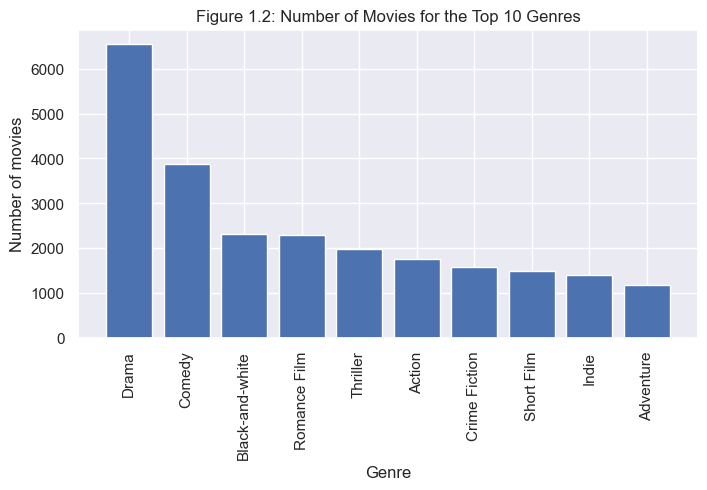

In [7]:
#plot the top 10 genres
plt.figure(figsize=(8, 4))
plt.bar(genre_main.index, genre_main.values)
plt.xticks(rotation=90)
plt.title("Figure 1.2: Number of Movies for the Top 10 Genres")
plt.xlabel("Genre")
plt.ylabel("Number of movies")
plt.show()


In [8]:
#filter the movies that have the genres in genre_main, not necessarily the first genre
movies_main = movies[movies['genre'].apply(lambda x: any(item for item in x if item in genre_main.index))].copy()
print(movies_main.shape)
movies_main.head()


(12463, 14)


,wikipedia_movie_ID,freebase_movie_ID,movie_name,movie_release_date,movie_box_office_revenue,movie_runtime,movie_languages,movie_countries,movie_genres,year_released,tconst,averageRating,numVotes,genre
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,tt0228333,4.9,56928.0,"[Thriller, Science Fiction, Horror, Adventure,..."
2,13696889,/m/03cfc81,The Gangsters,1913-05-29,NaN,35.0,"{""/m/06ppq"": ""Silent film"", ""/m/02h40lc"": ""Eng...","{""/m/09c7w0"": ""United States of America""}","{""/m/02hmvc"": ""Short Film"", ""/m/06ppq"": ""Silen...",1913,tt0002894,6.8,17.0,"[Short Film, Silent film, Indie, Black-and-whi..."
3,10408933,/m/02qc0j7,Alexander's Ragtime Band,1938-08-16,3600000.0,106.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/04t36"": ""Musical"", ""/m/01z4y"": ""Comedy"", ...",1938,tt0029852,6.8,2268.0,"[Musical, Comedy, Black-and-white]"
5,171005,/m/016ywb,Henry V,1989-11-08,10161099.0,137.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/04xvh5"": ""Costume drama"", ""/m/082gq"": ""Wa...",1989,tt0097499,7.5,31208.0,"[Costume drama, War film, Epic, Period piece, ..."
6,77856,/m/0kcn7,Mary Poppins,1964-08-27,102272727.0,139.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/0hj3myq"": ""Children's/Family"", ""/m/04t36""...",1964,tt0058331,7.8,181829.0,"[Children's/Family, Musical, Fantasy, Comedy, ..."


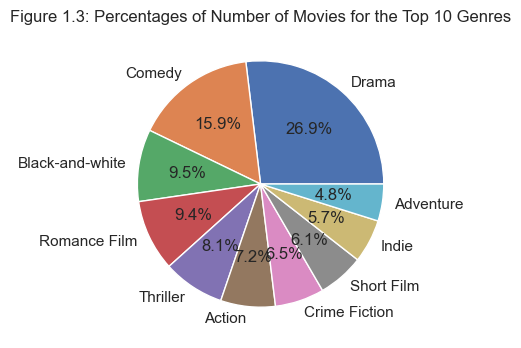

In [9]:
# plot a pie chart for the top 10 genres in the decade 2000-2010 which shows the percentage of the number of movies for each genre in genre_main
movie_genre=movies_main['genre'].explode().value_counts()[genre_main.index]
plt.figure(figsize=(8, 4))
plt.pie(movie_genre.values, labels=movie_genre.index, autopct='%1.1f%%')
plt.title("Figure 1.3: Percentages of Number of Movies for the Top 10 Genres")
plt.show()

Given that our criterion for categorizing "good" movies hinges on those with a rating surpassing 7, we proceed to implement a filtering mechanism. This entails narrowing our focus exclusively to movies meeting this specific high-rating threshold. By concentrating on this subset of films, we aim to glean more targeted insights into the characteristics and trends associated with movies that align with the established criteria for excellence.

(10,)
Index(['Drama', 'Comedy', 'Black-and-white', 'Romance Film', 'Thriller',
       'Action', 'Crime Fiction', 'Short Film', 'Indie', 'Adventure'],
      dtype='object', name='genre')


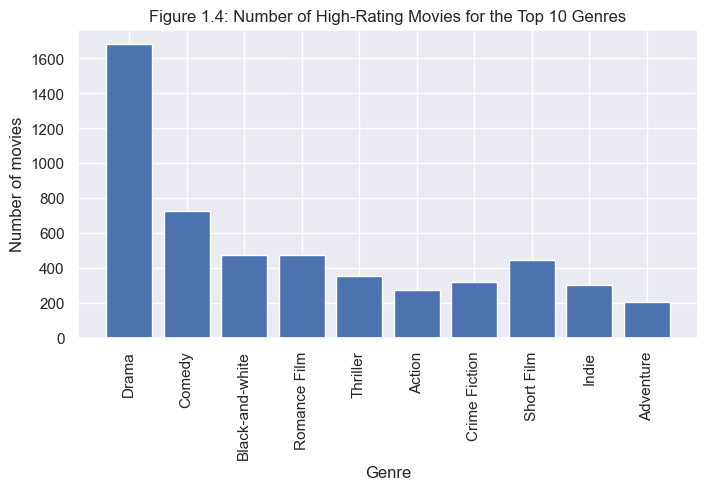

In [10]:
#filter the movies with rating higher than 7 from the movies_main dataset
movies_main_filtered= movies_main[movies_main['averageRating']>=7].copy()
#for each genre in genre_main, find the number of movies in movies_main_filter that have the genre
#and plot the number of movies for each genre
genre_main_filtered = movies_main_filtered['genre'].explode().value_counts()[genre_main.index]
print(genre_main_filtered.shape)
print(genre_main_filtered.index)
plt.figure(figsize=(8, 4))
plt.bar(genre_main_filtered.index, genre_main_filtered.values)
plt.xticks(rotation=90)
plt.title("Figure 1.4: Number of High-Rating Movies for the Top 10 Genres")
plt.xlabel("Genre")
plt.ylabel("Number of movies")
plt.show()

The graphical representation highlights the prominence of the __Drama__ genre, possessing the highest count of highly-rated movies, a figure significantly surpassing other genres. However, it is imperative to consider that the sheer abundance of drama films in the dataset could contribute to this observation. To delve deeper into the matter, we meticulously examine the ratio of high-rated movies to the total number of movies within each genre, providing a more nuanced perspective on the prevalence of quality content within the diverse genres.

(10, 2)


/var/folders/9_/z1m27wy57j34pk1k36dtbd280000gn/T/ipykernel_3619/2413303175.py:6: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



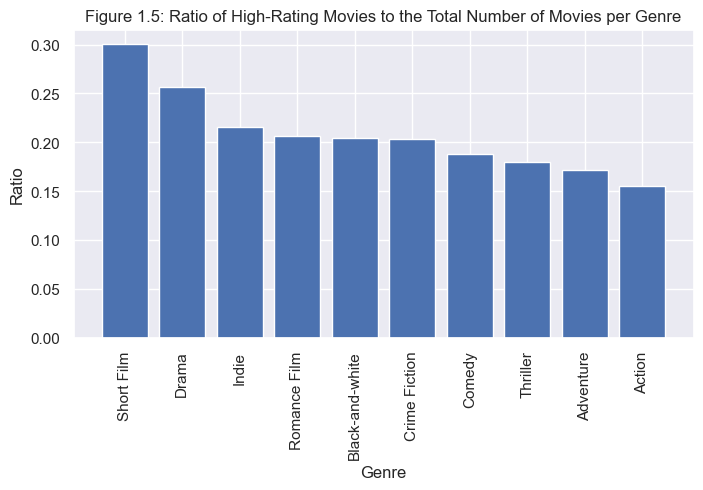

In [11]:
#for each genre, calculate the ratio of movies with rating higher than 7 / total number of movies in that genre
genre_ratio = pd.DataFrame(columns=['genre', 'ratio'])
for g in genre_main.index:
    ratio = len(movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: g in x)]) / len(movies_main[movies_main['genre'].apply(lambda x: g in x)])
    #add the genre and ratio to the dataframe
    genre_ratio = pd.concat([genre_ratio, pd.DataFrame({'genre': [g], 'ratio': [ratio]})], ignore_index=True)#sort the dataframe by ratio
genre_ratio = genre_ratio.sort_values(by='ratio', ascending=False)
print(genre_ratio.shape)
#plot the ratio
plt.figure(figsize=(8, 4))
plt.bar(genre_ratio['genre'], genre_ratio['ratio'])
plt.xticks(rotation=90)
plt.title("Figure 1.5: Ratio of High-Rating Movies to the Total Number of Movies per Genre")
plt.xlabel("Genre")
plt.ylabel("Ratio")
plt.show()


The graph reveals noteworthy insights into the distribution of highly-rated movies across genres. Notably, __Short Films__ exhibit the highest ratio of highly-rated movies to the total number of short films, positioning it at the forefront. __Drama__, despite its prominence in sheer numbers, takes the second position in this ratio analysis. Conversely, __Adventure__ and __Action__ genres exhibit the lowest ratios, indicating a comparatively lower prevalence of highly-rated movies within these genres. This nuanced examination contributes to a more comprehensive understanding of the quality distribution across various film genres.

Subsequently, we incorporate the temporal variable into our analysis to explore whether certain genres exhibit a notable concentration of highly-rated movies during specific time periods. The objective is to discern if there are temporal intervals wherein a particular genre experiences a significantly higher count of highly-rated movies compared to other periods. This temporal analysis aims to uncover patterns and trends in the distribution of high-quality movies within individual genres across different epochs.

In [12]:
#create a new dataframe with only the top 10 genres and has a rating larger than 7
movies_main = movies[movies["averageRating"] >= 7].copy()
movies_main = movies_main[movies_main["year_released"] < 2010].copy()
movies_main = movies_main.reset_index(drop=True)
print(movies_main.shape)
movies_main.head()

(2979, 14)


,wikipedia_movie_ID,freebase_movie_ID,movie_name,movie_release_date,movie_box_office_revenue,movie_runtime,movie_languages,movie_countries,movie_genres,year_released,tconst,averageRating,numVotes,genre
0,171005,/m/016ywb,Henry V,1989-11-08,10161099.0,137.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/04xvh5"": ""Costume drama"", ""/m/082gq"": ""Wa...",1989,tt0097499,7.5,31208.0,"[Costume drama, War film, Epic, Period piece, ..."
1,77856,/m/0kcn7,Mary Poppins,1964-08-27,102272727.0,139.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/0hj3myq"": ""Children's/Family"", ""/m/04t36""...",1964,tt0058331,7.8,181829.0,"[Children's/Family, Musical, Fantasy, Comedy, ..."
2,24399617,/m/07s63_7,Bruce Lee: The Lost Interview,1994-11-02,NaN,30.0,"{""/m/02h40lc"": ""English Language""}","{""/m/0d060g"": ""Canada""}","{""/m/02hmvc"": ""Short Film""}",1994,tt0432762,8.6,123.0,[Short Film]
3,8669450,/m/027d9tv,One Six Right,2005-11-25,NaN,73.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/0jtdp"": ""Documentary""}",2005,tt0475994,7.9,457.0,[Documentary]
4,164388,/m/015wmt,The Great Santini,1979-10-26,4702575.0,115.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02h8pkk"": ""Family Drama"", ""/m/07s9rl0"": ""...",1979,tt0079239,7.2,6812.0,"[Family Drama, Drama]"


In [13]:
# now we explore the combination of genres
# plot the number of movies for each combination of genres of the top 10 genres in each decade
plt.figure(figsize=(8, 4))
def plot_genre_combination_decade(genre1, genre2):
    # create a new dataframe with only the two genres
    movies_genre = movies_main[movies_main['genre'].apply(lambda x: genre1 in x and genre2 in x)].copy()
    # create a new column with the decade
    movies_genre['decade'] = movies_genre['year_released'].apply(lambda x: int(x) // 10 * 10)
    # create a new dataframe with the number of movies for each decade
    movies_genre_decade = movies_genre['decade'].value_counts().sort_index()
    # plot the number of movies for each decade

    plt.bar(movies_genre_decade.index, movies_genre_decade.values,width=5)
    plt.title(f"Number of {genre1} and {genre2} Movies for Each Past Decade")
    plt.xlabel("Decade")
    plt.ylabel("Number of movies")
    plt.show()


# apply the function to the top 10 genres
interact(plot_genre_combination_decade, genre1=genre_main.index, genre2=genre_main.index)

<Figure size 800x400 with 0 Axes>

interactive(children=(Dropdown(description='genre1', options=('Drama', 'Comedy', 'Black-and-white', 'Romance F…

<function __main__.plot_genre_combination_decade(genre1, genre2)>

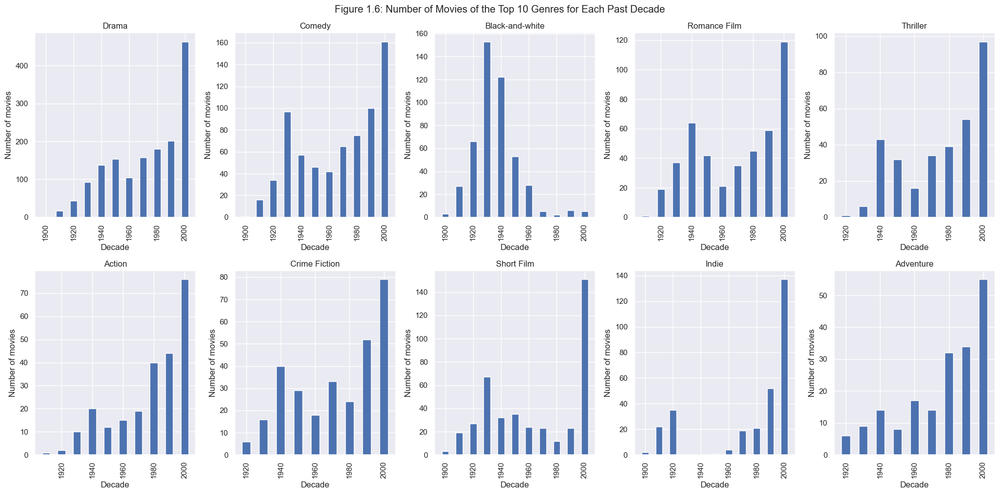

In [14]:
# draw a 2*5 subplot of the number of movies for the first 16 combinations of genres of the top 10 genres in each decade, which are the most frequent combinations
# create a new dataframe with only the top 10 genres
movies_main = movies_main[movies_main['genre'].apply(lambda x: any(item for item in x if item in genre_main.index))].copy() 
# create a new column with the decade
movies_main['decade'] = movies_main['year_released'].apply(lambda x: int(x) // 10 * 10)
# create a new dataframe with the number of movies for each decade
movies_main_decade = movies_main['decade'].value_counts().sort_index()

plt.figure(figsize=(20, 10))
plt.suptitle("Figure 1.6: Number of Movies of the Top 10 Genres for Each Past Decade")
# for each genre
for i in range(10):
    # create a new dataframe with only the genre
    movies_genre = movies_main[movies_main['genre'].apply(lambda x: genre_main.index[i] in x)].copy()
    # create a new dataframe with the number of movies for each decade
    movies_genre_decade = movies_genre['decade'].value_counts().sort_index()
    # plot the number of movies for each decade
    plt.subplot(2, 5, i + 1)
    plt.bar(movies_genre_decade.index, movies_genre_decade.values,width=5)
    plt.title(genre_main.index[i])
    plt.xlabel("Decade")
    plt.ylabel("Number of movies")
    plt.xticks(rotation=90)
    plt.tight_layout()
# name the plot

plt.show()


In [15]:
# create a new dataframe with only the top 10 genres
movies_main = movies_main[movies_main['genre'].apply(lambda x: any(item for item in x if item in genre_main.index))].copy()
# create a new column with the decade
movies_main['decade'] = movies_main['year_released'].apply(lambda x: int(x) // 10 * 10)
# create a new dataframe with the number of movies for each decade
movies_main_decade = movies_main['decade'].value_counts().sort_index()
# create a new dataframe with the number of movies for each genre and decade
movies_main_decade_genre = pd.DataFrame(columns=['decade', 'genre', 'number'])
# for each decade
for d in movies_main_decade.index:
    # for each genre
    for g in genre_main.index:
        # create a new dataframe with only the genre and decade
        movies_genre_decade = movies_main[(movies_main['genre'].apply(lambda x: g in x)) & (movies_main['decade'] == d)].copy()
        # add the number of movies to the dataframe
        movies_main_decade_genre = pd.concat([movies_main_decade_genre, pd.DataFrame({'decade': [d], 'genre': [g], 'number': [len(movies_genre_decade)]})], ignore_index=True)
# plot the number of movies for each genre and decade
fig = px.bar(movies_main_decade_genre, x="decade", y="number", color="genre", barmode="group",width=1200)
fig.update_layout(title_text="Figure 1.6: Number of Movies of the Top 10 Genres for Each Past Decade")
fig.write_html("1-6.html")
fig.show()

The graphical representation highlights two notable surges in the number of highly-rated movies throughout history: __one during the 1930s and another in the 2000s__.  During these intervals, there is a pronounced surge in the number of movies receiving high ratings. Intriguingly, in the aftermath of both periods, there is a noticeable decline, coinciding with two significant economic crises—the Great Depression in the 1930s and the global financial crisis of 2008. The observed correlation between economic downturns and fluctuations in the production and reception of high-quality movies prompts an exploration into the intricate dynamics at play during times of economic instability. Unraveling the contextual factors influencing these trends can provide valuable insights into the evolving landscape of the film industry across different historical epochs.

The analysis of the graphical representation yields several noteworthy insights. Firstly, **Comedy** and **Romance Film** emerge as the most popular highly rated genres, with a notable surge in popularity since the 1960s. Secondly, genres such as **Thriller**, **Crime Fiction**, and **Indie** films exhibit a rising trend in popularity. Thirdly, there is a distinctive surge in the prevalence of highly rated **Short Films** at the onset of the 21st century. Lastly, despite an overall increase in the number of films, **Adventure** and **Action** genres consistently exhibit a lower proportion of high-rated movies.

Now, let's dig deeper into the __Drama__ genre to examine the impact of its combinations with other genres.

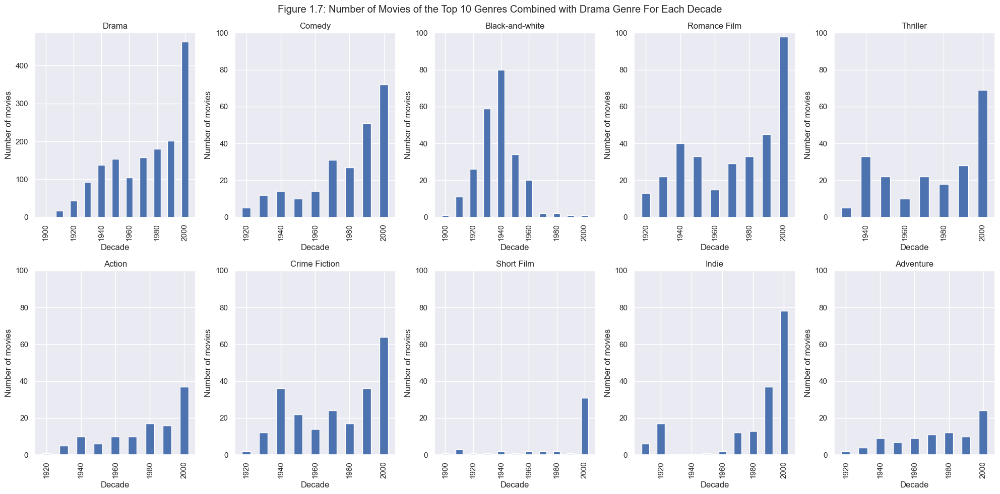

In [16]:
# draw a 2*5 subplot of the number of movies for the movies that are both drama and other genres in each decade
plt.figure(figsize=(20, 10))
plt.suptitle("Figure 1.7: Number of Movies of the Top 10 Genres Combined with Drama Genre For Each Decade")
# for each genre
for i in range(10):
    # create a new dataframe with only the genre
    movies_genre = movies_main[movies_main['genre'].apply(lambda x: genre_main.index[i] in x and "Drama" in x)].copy()
    # create a new dataframe with the number of movies for each decade
    movies_genre_decade = movies_genre['decade'].value_counts().sort_index()
    # plot the number of movies for each decade
    plt.subplot(2, 5, i + 1)
    plt.bar(movies_genre_decade.index, movies_genre_decade.values,width=5)
    plt.title(genre_main.index[i])
    plt.xlabel("Decade")
    plt.ylabel("Number of movies")
    if i!=0:
        plt.ylim(0, 100)
    plt.xticks(rotation=90)
    plt.tight_layout()
# add a name for the entire figure

plt.show()


In [17]:
# use plotly to plot the above plot except for Drama and Drama genre
# create a new dataframe with only the top 10 genres
movies_main = movies_main[movies_main['genre'].apply(lambda x: any(item for item in x if item in genre_main.index) and 'Drama' in x)].copy()
# create a new column with the decade
movies_main['decade'] = movies_main['year_released'].apply(lambda x: int(x) // 10 * 10)
# create a new dataframe with the number of movies for each decade
movies_main_decade = movies_main['decade'].value_counts().sort_index()
# create a new dataframe with the number of movies for each genre and decade
movies_main_decade_genre = pd.DataFrame(columns=['decade', 'genre', 'number'])
# for each decade
for d in movies_main_decade.index:
    # for each genre
    for g in genre_main.index:
        if(g=='Drama'):
            continue
        # create a new dataframe with only the genre and decade
        movies_genre_decade = movies_main[(movies_main['genre'].apply(lambda x: g in x)) & (movies_main['decade'] == d)].copy()
        # add the number of movies to the dataframe
        movies_main_decade_genre = pd.concat([movies_main_decade_genre, pd.DataFrame({'decade': [d], 'genre': [g], 'number': [len(movies_genre_decade)]})], ignore_index=True)
# plot the number of movies for each genre and decade
fig = px.bar(movies_main_decade_genre, x="decade", y="number", color="genre", barmode="group",width=1200)
fig.update_layout(title_text="Figure 1.7:  Number of Movies of the Top 10 Genres Combined with Drama Genre For Each Decade")
fig.write_html("1-7.html")
fig.show()

From the aforementioned analysis, we observe a similar trend as in the overall analysis. It is noteworthy that __Romance Films__ and __Comedies__ are the most popular genres when combined with Drama. Additionally, the combination of __Short Films__ and __Drama__ gains popularity particularly after the year 2000. The coherence in trends underscores the dominant influence of the Drama genre in highly rated movies.

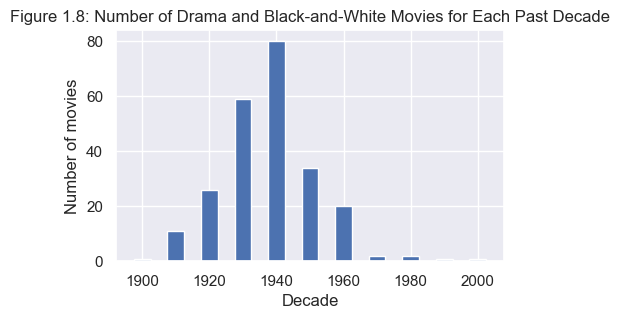

In [18]:
plt.figure(figsize=(5,3))
# plot the number of movies each decade for Drama and Black-and-White Movies
movies_genre = movies_main[movies_main['genre'].apply(lambda x: ('Black-and-white' in x and 'Drama' in x))].copy()
movies_genre['decade'] = movies_main['year_released'].apply(lambda x: int(x) // 10 * 10)
movies_genre_decade = movies_genre['decade'].value_counts().sort_index()
plt.bar(movies_genre_decade.index, movies_genre_decade.values,width=5)
plt.title("Figure 1.8: Number of Drama and Black-and-White Movies for Each Past Decade")
plt.xlabel("Decade")
plt.ylabel("Number of movies")
plt.show()

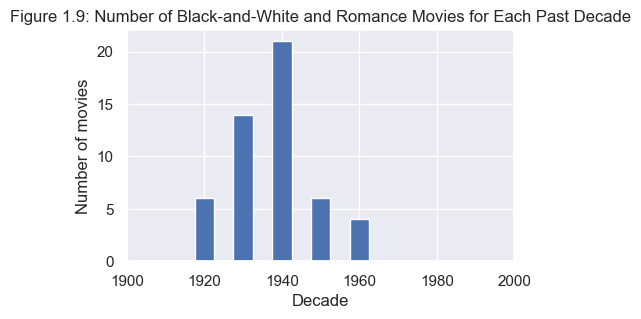

In [19]:
# plot the number of movies each decade for Black-and-white and Romance Movies
movies_genre = movies_main[movies_main['genre'].apply(lambda x: 'Black-and-white' in x and 'Romance Film' in x)].copy()
movies_genre['decade'] = movies_main['year_released'].apply(lambda x: int(x) // 10 * 10)
movies_genre_decade = movies_genre['decade'].value_counts().sort_index()
plt.figure(figsize=(5,3))
plt.bar(movies_genre_decade.index, movies_genre_decade.values,width=5)
plt.title("Figure 1.9: Number of Black-and-White and Romance Movies for Each Past Decade")
plt.xlabel("Decade")
plt.xlim(1900,2000)
plt.ylabel("Number of movies")
plt.show()

It comes as no surprise that a significant proportion of highly-rated movies in black-and-white are made during the 1940s, with a notable concentration within the drama genre. This observation underscores the enduring appeal of the black-and-white aesthetic in conveying the nuanced themes often associated with dramatic narratives. Furthermore, within the realm of black-and-white films, the comedy and romance genres emerge as particularly prominent, constituting the majority of high-rated movies. This alignment suggests a unique intersection of visual style and storytelling elements that contribute to the success and acclaim of black-and-white comedies and romances. A more in-depth exploration of these specific films can shed light on the distinctive qualities that make them stand out within the broader landscape of high-quality cinema.

Delving into the significant surge observed in the 2000s, we aim to meticulously examine the intricate effects resulting from combinations of genres during this prolific period. By scrutinizing the interplay between different genres within this temporal frame, we seek to unravel patterns, preferences, and potential synergies that contributed to the remarkable increase in the number of highly-rated movies. This focused analysis on genre combinations promises to unveil insights into the evolving tastes, creative trends, and collaborative dynamics that defined the cinematic landscape during this particular era, enriching our understanding of the multifaceted factors influencing the success of movies.

In [20]:
movies_2000 = movies_main[movies_main['year_released'] >= 2000].copy()

# Define a function to plot the number of movies for each year after 2000
def plot_genre_combination_year(genre1, genre2):
    # Create a new dataframe with only the two genres
    movies_genre = movies_2000[movies_2000['genre'].apply(lambda x: genre1 in x and genre2 in x)].copy()
    # Create a new dataframe with the number of movies for each year
    movies_genre_year = movies_genre['year_released'].value_counts().sort_index()
    # Plot the number of movies for each year
    plt.figure(figsize=(8, 4))
    plt.bar(movies_genre_year.index, movies_genre_year.values)
    plt.title("Number of movies for each year after 2000")
    plt.xlabel("Year")
    plt.ylabel("Number of movies")
    plt.show()

# Create interactive widgets
genre1_widget = widgets.Dropdown(options=genre_main.index, description='Genre 1:')
genre2_widget = widgets.Dropdown(options=genre_main.index, description='Genre 2:')

# Set up the interactive widget using interact
interact(plot_genre_combination_year, genre1=genre1_widget, genre2=genre2_widget)


interactive(children=(Dropdown(description='Genre 1:', options=('Drama', 'Comedy', 'Black-and-white', 'Romance…

<function __main__.plot_genre_combination_year(genre1, genre2)>

In [21]:
# draw a px plot of the number of movies for the movies that are both drama and other genres in each year after 2000
# create a new dataframe with only the top 10 genres
movies_2000 = movies_2000[movies_2000['genre'].apply(lambda x: any(item for item in x if item in genre_main.index) and 'Drama' in x)].copy()
# create a new dataframe with the number of movies for each year
movies_2000_year = movies_2000['year_released'].value_counts().sort_index()
# create a new dataframe with the number of movies for each genre and year
movies_2000_year_genre = pd.DataFrame(columns=['year', 'genre', 'number'])
# for each year
for y in movies_2000_year.index:
    # for each genre
    for g in genre_main.index:
        if(g=='Drama'):
            continue
        # create a new dataframe with only the genre and year
        movies_genre_year = movies_2000[(movies_2000['genre'].apply(lambda x: g in x)) & (movies_2000['year_released'] == y)].copy()
        # add the number of movies to the dataframe
        movies_2000_year_genre = pd.concat([movies_2000_year_genre, pd.DataFrame({'year': [y], 'genre': [g], 'number': [len(movies_genre_year)]})], ignore_index=True)
# plot the number of movies for each genre and year
fig = px.bar(movies_2000_year_genre, x="year", y="number", color="genre", barmode="group",width=1200)
fig.update_layout(title_text="Figure 1.10: Number of Movies of the Top 10 Genres Combined with Drama Genre For Each Year After 2000")
fig.write_html("1-10.html")
fig.show()


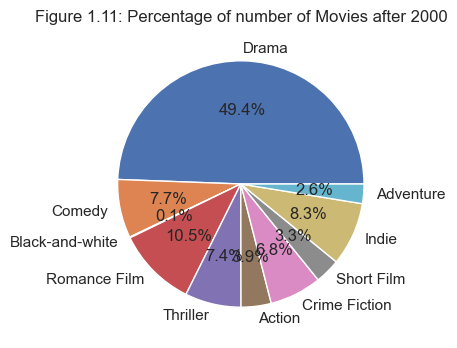

In [22]:
#plot a pie chart for the top 10 genres in the decade 2000-2010 which shows the percentage of the number of movies for each genre in genre_main
movie_genre=movies_2000['genre'].explode().value_counts()[genre_main.index]
plt.figure(figsize=(8, 4))
plt.pie(movie_genre.values, labels=movie_genre.index, autopct='%1.1f%%')
plt.title("Figure 1.11: Percentage of number of Movies after 2000")
plt.show()

From the comprehensive analysis presented above, a discernible trend emerges, indicating that the __Drama__ genre has consistently dominated the cinematic landscape. This dominance is reflected in both the largest number of total movies across all genres. The enduring popularity and prevalence of drama underscore its universal appeal, serving as a versatile and enduring vehicle for storytelling that resonates with diverse audiences. As we continue to explore the intricacies of genre dynamics, the prominence of drama stands as a testament to its enduring significance within the ever-evolving world of cinema.

### DURATION

The duration of a movie, a fundamental element in cinematic storytelling, serves as a crucial factor influencing the overall viewing experience and perceived quality. Film durations vary widely, ranging from concise short films to sprawling epics. The impact of a movie's duration on its quality is a nuanced consideration that intertwines with storytelling techniques, pacing, audience engagement, and thematic depth. A well-crafted film can leverage its duration to immerse viewers in its narrative world, allowing for character development, plot intricacies, and emotional resonance. However, an excessively long or brief duration may pose challenges, potentially leading to pacing issues or insufficient exploration of complex themes. This intricate interplay between movie duration and quality underscores the significance of understanding how filmmakers navigate the temporal dimension to create compelling and impactful cinematic experiences.

In [23]:
#duration
#the distribution of runtime and its correlation with rating
print(movies[["movie_runtime", "averageRating"]].count())
duration = movies[["movie_runtime", "averageRating"]].dropna()
duration.count()

movie_runtime    13609
averageRating    14369
dtype: int64


movie_runtime    13609
averageRating    13609
dtype: int64

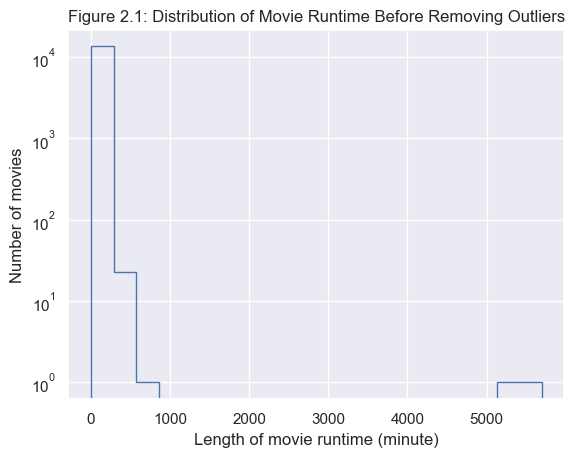

In [24]:
# histogram plot without removing outliers
plt.hist(duration["movie_runtime"], histtype="step", log=True, bins=20)
plt.title("Figure 2.1: Distribution of Movie Runtime Before Removing Outliers")
plt.xlabel("Length of movie runtime (minute)")
plt.ylabel("Number of movies")
plt.show()


Upon examination of the graph presented above, a noteworthy pattern emerges where a considerable number of films exhibit either exceptionally short or excessively long durations, exceeding 5000 minutes. To ensure the precision and reliability of our analysis, it is imperative to address these outliers. Eliminating such extreme values is essential for a more accurate representation of the dataset and will contribute to the robustness of our findings.

Additionally, it is pertinent to acknowledge that short films often have relatively brief durations, which could potentially skew our analysis of runtime for regular feature-length movies. Fortunately, a substantial portion of these short films falls within the category of outliers slated for removal. This strategic refinement of the dataset aims to enhance the integrity of our examination of movie durations and facilitate a more nuanced understanding of the temporal aspects within the cinematic landscape.

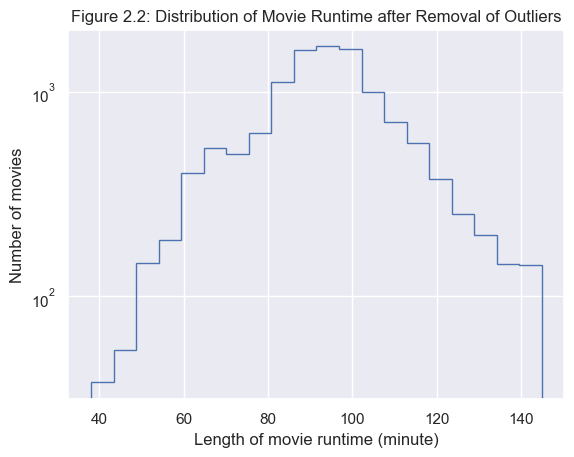

In [25]:
# histogram plot with removing outliers using IQR
q1 = duration["movie_runtime"].quantile(0.25)
q3 = duration["movie_runtime"].quantile(0.75)
iqr = q3 - q1
duration = duration[duration["movie_runtime"] < q3 + 1.5 * iqr]
duration = duration[duration["movie_runtime"] > q1 - 1.5 * iqr]

plt.hist(duration["movie_runtime"], histtype="step", log=True, bins=20)
plt.title("Figure 2.2: Distribution of Movie Runtime after Removal of Outliers")
plt.xlabel("Length of movie runtime (minute)")
plt.ylabel("Number of movies")
plt.show()


Text(0.5, 0.98, 'Figure 2.3: Correlation between Movie Runtime and Rating')

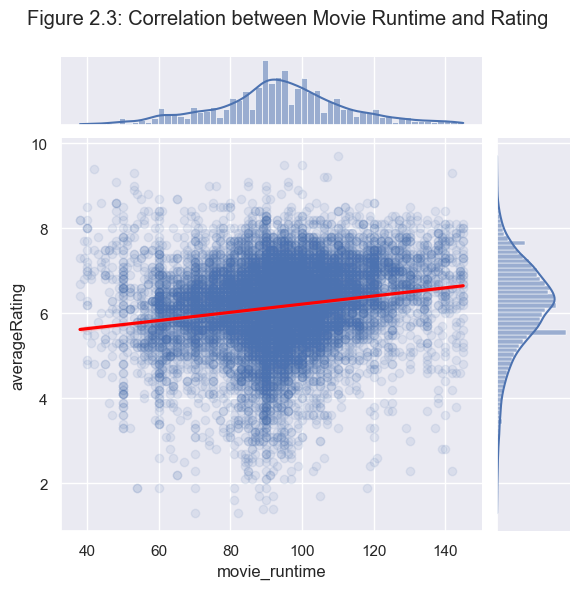

In [26]:
# use sns to plot the scatter plot of runtime and rating with regression line
sns.jointplot(x="movie_runtime", y="averageRating", data=duration, kind="reg", scatter_kws={"alpha": 0.1}, line_kws={"color": "red"})
# set the title
plt.subplots_adjust(top=0.9)
plt.suptitle("Figure 2.3: Correlation between Movie Runtime and Rating")

In [27]:
# plot the above plot using plotly to generate an interactive plot to html
# with the regression line colored red
fig = px.scatter(duration, x="movie_runtime", y="averageRating", trendline="ols", trendline_color_override="red")
fig.update_layout(title="Figure 2.3: Correlation between Movie Runtime and Rating")
fig.write_html("2-3.html")
fig.show()

The preliminary regression analysis indicates a noteworthy trend where longer durations tend to correlate with higher average ratings. This initial observation prompts further investigation to validate and refine our understanding of the relationship between movie duration and audience ratings. While this finding suggests a positive association, additional factors such as genre, thematic content, and storytelling techniques may contribute to a more nuanced interpretation. Therefore, a more in-depth and comprehensive analysis is warranted to ensure a robust understanding of the intricate dynamics influencing movie ratings in relation to their durations.

In [28]:
#perform linear regression on duration data, and plot the regression line
model=smf.ols(formula='averageRating ~ movie_runtime', data=duration)
results=model.fit()
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     374.7
Date:                Thu, 21 Dec 2023   Prob (F-statistic):           3.26e-82
Time:                        19:55:42   Log-Likelihood:                -16873.
No. Observations:               11874   AIC:                         3.375e+04
Df Residuals:                   11872   BIC:                         3.376e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         5.2557      0.047    110.670

Our analysis adopts a dual perspective, delineated by two distinct criteria. Firstly, the dataset is bifurcated based on ratings, with a division into two halves. Subsequently, the dataset is segregated based on duration, categorizing movies with a runtime exceeding 80 minutes as long-duration films. Two sets of t-tests are conducted to discern potential statistically significant differences: one examines the mean average duration between high-rating and lower-rating movies, while the other investigates the mean average rating between long-duration and shorter-duration movies. These parallel analyses offer a comprehensive exploration of the interplay between movie ratings, durations, and their potential impact on cinematic characteristics.

In [29]:
#filter the movies with rating higher than 7 from the movies_main dataset
movies_high_rating= duration[duration['averageRating']>=7].copy()
movies_non_high_rating= duration[duration['averageRating']<7].copy()
print(movies_high_rating.shape)
print(movies_non_high_rating.shape)


(2459, 2)
(9415, 2)


Conducting a t-test on the runtime variable is imperative to ascertain the presence of a statistically significant distinction between two subsets of movies based on their ratings. Specifically, this analysis aims to discern whether there exists a noteworthy difference in runtime duration between movies with ratings exceeding 7 and those with ratings below 7. By rigorously applying statistical methods, we endeavor to illuminate any discernible patterns or variations in movie runtimes associated with differing rating categories.

In [30]:
#perform a t-test on the runtime of movies with rating higher than 7 and movies with rating lower than 7 to see if there is a significant difference
stats.ttest_ind(a=movies_high_rating["movie_runtime"], b=movies_non_high_rating["movie_runtime"],equal_var=False)

TtestResult(statistic=15.615541110148706, pvalue=3.6823789974589413e-53, df=3435.0436677777066)

In [31]:
#calculate the mean  of runtime for movies with rating higher than 7 and movies with rating lower than 7 and their difference
print(movies_high_rating["movie_runtime"].mean())
print(movies_non_high_rating["movie_runtime"].mean())
diff=movies_high_rating["movie_runtime"].mean()-movies_non_high_rating["movie_runtime"].mean()
print(f"The mean difference in duration is:{diff}")

#calculate the percentage of difference
perc=diff/movies_non_high_rating["movie_runtime"].mean()*100
print(f"The percentage difference in duration is:{perc}")

99.47417649450996
92.34965480616039
The mean difference in duration is:7.124521688349574
The percentage difference in duration is:7.714724763512941


In [32]:
# visualize the t-test result using plotly
fig = px.histogram(duration, x="movie_runtime", color="averageRating", marginal="box", barmode="overlay",nbins=20)
fig.update_layout(title_text="Figure 2.4: Distribution of Movie Runtime")
fig.write_html("2-4.html")
fig.show()

Based on the preceding analysis, it is evident that a statistically significant difference exists between the means of movie runtimes for those with ratings exceeding 7 and those with ratings below 7. The mean duration of high-rating movies is found to be 7.71% higher than that of their lower-rated counterparts. This finding suggests a notable variation in runtime characteristics between movies of distinct rating categories, emphasizing the potential influence of audience ratings on the temporal aspects of cinematic storytelling.

In [33]:
#split the movies into two groups, one with movie_runtime>=80 and the other with movie_runtime<80
movies_long_duration=duration[duration["movie_runtime"]>=80]
movies_short_duration=duration[duration["movie_runtime"]<80]

In [34]:
#perform a t-test on the rating of movies with runtime>=80 and movies with runtime<80 to see if there is a significant difference
stats.ttest_ind(a=movies_long_duration["averageRating"], b=movies_short_duration["averageRating"],equal_var=False)

TtestResult(statistic=6.304250491709349, pvalue=3.2633531397026146e-10, df=3444.252730345831)

In [35]:
#calculate the mean of rating for movies with runtime>=80 and movies with runtime<80 and their difference
print(movies_long_duration["averageRating"].mean())
print(movies_short_duration["averageRating"].mean())
diff=movies_long_duration["averageRating"].mean()-movies_short_duration["averageRating"].mean()
print(f"The mean difference in rating is:{diff}")

#calculate the percentage of difference
perc=diff/movies_short_duration["averageRating"].mean()*100
print(f"The percentage difference in rating is:{perc}")


6.185743995008838
6.037749224634471
The mean difference in rating is:0.1479947703743676
The percentage difference in rating is:2.451157954201506


In [36]:
# visualize the t-test result using plotly
fig = px.histogram(duration, x="averageRating", color="movie_runtime", marginal="box", barmode="overlay",nbins=20)
fig.update_layout(title_text="Figure 2.5: Distribution of Movie Rating")
fig.write_html("2-5.html")
fig.show()

Based on the outcomes presented above, it is evident that a statistically significant difference exists in the means of average ratings between long-duration movies and shorter-duration movies. Specifically, long-duration movies exhibit a higher mean rating of 6.19, contrasting with the mean rating of 6.03 observed for shorter-duration movies. This finding underscores a notable association between the temporal extent of movies and audience ratings, suggesting that longer-duration films tend to garner higher average ratings compared to their shorter-duration counterparts.

# Topic Analysis : (Imane+Lina)

### Data Preprocessing

In [37]:
#datapath
DATA_FOLDER = "./data/"
PLOT_SUMMARY_PATH = DATA_FOLDER+"CMU/plot_summaries.txt"

In [38]:
plot_summaries = pd.read_csv(PLOT_SUMMARY_PATH, sep="\t", header=None)
plot_summaries = plot_summaries.rename(columns={0: "MovieID", 1: "PlotSummary"})
plot_summaries = plot_summaries.dropna(subset=['PlotSummary'])

plot_summaries

,MovieID,PlotSummary
0,23890098,"Shlykov, a hard-working taxi driver and Lyosha..."
1,31186339,The nation of Panem consists of a wealthy Capi...
2,20663735,Poovalli Induchoodan is sentenced for six yea...
3,2231378,"The Lemon Drop Kid , a New York City swindler,..."
4,595909,Seventh-day Adventist Church pastor Michael Ch...
...,...,...
42298,34808485,"The story is about Reema , a young Muslim scho..."
42299,1096473,"In 1928 Hollywood, director Leo Andreyev look..."
42300,35102018,American Luthier focuses on Randy Parsons’ tra...
42301,8628195,"Abdur Rehman Khan , a middle-aged dry fruit se..."


After defining the most "liked" genres according to the most ranked movies, we will proceed with the topic analysis among these movies (the most ranked). 
Thus, we will define the most liked topic in each top 5 most liked genres. 

In [39]:
nltk.download('stopwords')
nltk.download('wordnet')

stop_words = set(stopwords.words('english'))
nltk.download('punkt')  
lemmatizer = WordNetLemmatizer()

def preprocess(text):
    # Lowercasing
    text = text.lower()
    # Remove special characters
    text = re.sub(r'\W', ' ', text)
    # Tokenization and Lemmatization
    tokens = nltk.word_tokenize(text)
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words and len(word) > 3]
    print(tokens)
    return tokens

# Apply preprocessing to each PlotSummary
#plot_summaries['processed_plot'] = plot_summaries['PlotSummary'].apply(preprocess)


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/antoineschutz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/antoineschutz/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/antoineschutz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [40]:
from gensim.corpora import Dictionary
from gensim.models.ldamodel import LdaModel

In [41]:
# movies that have drama as one of their genres
drama_movies = movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: 'Drama' in x)].copy()
# from plot_summaries dataset, extract the plot summaries of the drama movies
drama_movies_plot = plot_summaries[plot_summaries['MovieID'].isin(drama_movies['wikipedia_movie_ID'])].copy()

# movies that have comedy as one of their genres
comedy_movies = movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: 'Comedy' in x)].copy()
# from plot_summaries dataset, extract the plot summaries of the comedy movies
comedy_movies_plot = plot_summaries[plot_summaries['MovieID'].isin(comedy_movies['wikipedia_movie_ID'])].copy()

# movies that have short film as one of their genres
short_movies = movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: 'Short Film' in x)].copy()

# from plot_summaries dataset, extract the plot summaries of the short movies
short_movies_plot = plot_summaries[plot_summaries['MovieID'].isin(short_movies['wikipedia_movie_ID'])].copy()

# movies that have Black-and-white as one of their genres
bw_movies = movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: 'Black-and-white' in x)].copy()
# from plot_summaries dataset, extract the plot summaries of the Black-and-white movies
bw_movies_plot = plot_summaries[plot_summaries['MovieID'].isin(bw_movies['wikipedia_movie_ID'])].copy()

# movies that have Romance film as one of their genres
romance_movies = movies_main_filtered[movies_main_filtered['genre'].apply(lambda x: 'Romance Film' in x)].copy()
# from plot_summaries dataset, extract the plot summaries of the Romance movies
romance_movies_plot = plot_summaries[plot_summaries['MovieID'].isin(romance_movies['wikipedia_movie_ID'])].copy()

In [42]:
#preprocess the plot summaries of the drama movies and store them in drama_movies_plot['processed_plot']
drama_movies_plot['processed_plot'] = drama_movies_plot['PlotSummary'].apply(preprocess)

# Create a dictionary representation of the documents
dictionary_drama = Dictionary(drama_movies_plot['processed_plot'])

# Filter out words that occur less than 5 documents, or more than 90% of the documents.
dictionary_drama.filter_extremes(no_below=5, no_above=0.95)

# Create a bag-of-words representation of the documents
corpus_drama = [dictionary_drama.doc2bow(doc) for doc in drama_movies_plot['processed_plot']]

['nation', 'panem', 'consists', 'wealthy', 'capitol', 'twelve', 'poorer', 'district', 'punishment', 'past', 'rebellion', 'district', 'must', 'provide', 'girl', 'age', 'selected', 'lottery', 'annual', 'hunger', 'game', 'tribute', 'must', 'fight', 'death', 'arena', 'sole', 'survivor', 'rewarded', 'fame', 'wealth', 'first', 'reaping', 'year', 'primrose', 'everdeen', 'chosen', 'district', 'older', 'sister', 'katniss', 'volunteer', 'take', 'place', 'peeta', 'mellark', 'baker', 'gave', 'katniss', 'bread', 'starving', 'district', 'tribute', 'katniss', 'peeta', 'taken', 'capitol', 'accompanied', 'frequently', 'drunk', 'mentor', 'past', 'victor', 'haymitch', 'abernathy', 'warns', 'career', 'tribute', 'train', 'intensively', 'special', 'academy', 'almost', 'always', 'interview', 'caesar', 'flickerman', 'peeta', 'unexpectedly', 'reveals', 'love', 'katniss', 'outraged', 'believing', 'ploy', 'gain', 'audience', 'support', 'sponsor', 'provide', 'game', 'gift', 'food', 'medicine', 'tool', 'however', 

In [43]:
#preprocess the plot summaries of the comedy movies and store them in comedy_movies_plot['processed_plot']
comedy_movies_plot['processed_plot'] = comedy_movies_plot['PlotSummary'].apply(preprocess)

#create a dictionary representation of the documents
dictionary_comedy = Dictionary(comedy_movies_plot['processed_plot'])

# Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary_comedy.filter_extremes(no_below=5, no_above=0.9)

# Create a bag-of-words representation of the documents
corpus_comedy = [dictionary_comedy.doc2bow(doc) for doc in comedy_movies_plot['processed_plot']]

['lemon', 'drop', 'york', 'city', 'swindler', 'illegally', 'touting', 'horse', 'florida', 'racetrack', 'several', 'successful', 'hustle', 'come', 'across', 'beautiful', 'gullible', 'woman', 'intending', 'money', 'convinces', 'switch', 'employing', 'prefabricated', 'unfortunately', 'woman', 'belongs', 'notorious', 'gangster', 'moose', 'moran', 'money', 'choice', 'finish', 'dead', 'last', 'furious', 'moran', 'demand', 'provide', 'christmas', 'make', 'year', 'decides', 'return', 'york', 'come', 'money', 'first', 'try', 'girlfriend', 'brainy', 'baxter', 'however', 'talk', 'long', 'term', 'commitment', 'arises', 'quickly', 'make', 'escape', 'next', 'visit', 'local', 'crime', 'bos', 'oxford', 'charley', 'past', 'dealing', 'fall', 'charley', 'serious', 'trouble', 'particularly', 'care', 'anyway', 'leaf', 'charley', 'establishment', 'give', 'hope', 'notice', 'cornerside', 'santa', 'claus', 'kettle', 'thinking', 'quickly', 'fashion', 'santa', 'suit', 'begin', 'collecting', 'donation', 'fails', 

In [44]:
#preprocess the plot summaries of the short movies and store them in short_movies_plot['processed_plot']
short_movies_plot['processed_plot'] = short_movies_plot['PlotSummary'].apply(preprocess)


#create a dictionary representation of the documents
dictionary_short = Dictionary(short_movies_plot['processed_plot'])

# Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary_short.filter_extremes(no_below=5, no_above=0.9)

# Create a bag-of-words representation of the documents
corpus_short = [dictionary_short.doc2bow(doc) for doc in short_movies_plot['processed_plot']]

['wheezer', 'dickie', 'stymie', 'choose', 'play', 'hooky', 'school', 'fishing', 'farina', 'meanwhile', 'miss', 'kornman', 'taking', 'student', 'beach', 'amusement', 'pier', 'free', 'charge', 'spanky', 'cotton', 'deliver', 'sick', 'note', 'forged', 'dickie', 'stymie', 'wheezer', 'farina', 'miss', 'kornman', 'stating', 'absent', 'truant', 'officer', 'mickey', 'daniel', 'decides', 'teach', 'boy', 'lesson', 'truant', 'officer', 'lecture', 'boy', 'expect', 'sent', 'reform', 'school', 'frightens', 'much', 'insist', 'taken', 'beach', 'apologize', 'miss', 'kornman', 'route', 'stymie', 'spot', 'truant', 'officer', 'badge', 'boy', 'flee', 'officer', 'purposely', 'make', 'chase', 'long', 'eventually', 'catch', 'boy', 'miss', 'kornman', 'stop', 'daniel', 'locking', 'boy', 'reform', 'school', 'boy', 'promise', 'never', 'play', 'hooky']
['fascinated', 'story', 'aladdin', 'magic', 'lamp', 'gang', 'gather', 'together', 'several', 'gasoline', 'kerosene', 'lamp', 'lantern', 'electric', 'lamp', 'hoping',

In [45]:
#preprocess the plot summaries of the Black-and-white movies and store them in bw_movies_plot['processed_plot']
bw_movies_plot['processed_plot'] = bw_movies_plot['PlotSummary'].apply(preprocess)

#create a dictionary representation of the documents
dictionary_bw = Dictionary(bw_movies_plot['processed_plot'])

# Filter out words that occur less than 20 documents, or more than 50% of the documents.
dictionary_bw.filter_extremes(no_below=5, no_above=0.9)

# Create a bag-of-words representation of the documents
corpus_bw = [dictionary_bw.doc2bow(doc) for doc in bw_movies_plot['processed_plot']]

['frank', 'ross', 'crusading', 'reporter', 'city', 'newspaper', 'trail', 'crooked', 'assistant', 'jesse', 'hanley', 'running', 'governor', 'banton', 'construction', 'ross', 'see', 'hanley', 'burning', 'book', 'ledger', 'possible', 'investigation', 'brought', 'paper', 'ross', 'work', 'editor', 'patterson', 'back', 'ross', 'getting', 'hanley', 'hanley', 'decides', 'frame', 'knocked', 'covered', 'whiskey', 'runaway', 'collides', 'another', 'killing', 'young', 'people', 'thrown', 'prison', 'twenty', 'year', 'charge', 'automotive', 'manslaughter', 'meet', 'gangster', 'stacey', 'death', 'penalty', 'state', 'year', 'work', 'twine', 'making', 'room', 'together', 'stacey', 'fall', 'ross', 'debt', 'ross', 'save', 'knife', 'thrown', 'another', 'inmate', 'ross', 'reporter', 'friend', 'outside', 'trying', 'help', 'vindication', 'finding', 'real', 'culprit', 'success', 'stacey', 'agrees', 'help', 'ross', 'find', 'real', 'killer', 'help', 'escape', 'courthouse', 'arrange', 'stacey', 'named', 'ross', 

In [46]:
#preprocess the plot summaries of the Romance movies and store them in romance_movies_plot['processed_plot']
romance_movies_plot['processed_plot'] = romance_movies_plot['PlotSummary'].apply(preprocess)

#create a dictionary representation of the documents
dictionary_romance = Dictionary(romance_movies_plot['processed_plot'])

# Filter out words that occur less than 5 documents, or more than 50% of the documents.
dictionary_romance.filter_extremes(no_below=5, no_above=0.9)

# Create a bag-of-words representation of the documents
corpus_romance = [dictionary_romance.doc2bow(doc) for doc in romance_movies_plot['processed_plot']]



['ash', 'ash', 'london', 'england', 'film', 'surreal', 'journey', 'dream', 'misadventure', 'gabriel', 'darbeaux', 'young', 'screenwriter', 'martial', 'art', 'enthusiast', 'supplement', 'income', 'escorting', 'wealthy', 'woman', 'introduced', 'gabriel', 'character', 'chased', 'cornered', 'group', 'triad', 'thug', 'armed', 'sword', 'stick', 'nunchaku', 'using', 'nunchaku', 'gabriel', 'manages', 'fight', 'thug', 'find', 'whole', 'episode', 'early', 'morning', 'dream', 'dream', 'provides', 'inspiration', 'opening', 'scene', 'latest', 'screenplay', 'entitled', 'ash', 'ash', 'thriller', 'involving', 'italian', 'mafia', 'chinese', 'triad', 'generous', 'amount', 'martial', 'art', 'action', 'gabriel', 'belief', 'success', 'script', 'give', 'financial', 'independence', 'best', 'friend', 'michael', 'plan', 'setting', 'escort', 'agency', 'fund', 'project', 'resort', 'making', 'secret', 'recording', 'sexual', 'encounter', 'banker', 'wife', 'hope', 'earn', 'blackmail', 'gabriel', 'receives', 'call',

We will be performing the LDA algorithm for topic analysis.

In [47]:
# Set training parameters
num_topics = 3 # Adjust the number of topics
passes = 20     # Adjust the number of passes
genres=['Drama', 'Comedy', 'Short-film', 'Black-and-white', 'Romance-film']
dictionary = [dictionary_drama, dictionary_comedy, dictionary_short, dictionary_bw, dictionary_romance]

# Initialize counters for each genre
genre_topic_counts = {genre: [0] * num_topics for genre in genres}


for index_corpus, corpus in enumerate([corpus_drama, corpus_comedy, corpus_short, corpus_bw, corpus_romance] ):
    

    # Train the LDA model
    lda_model = LdaModel(corpus=corpus, id2word=dictionary[index_corpus], num_topics=num_topics, passes=passes, 
                                        minimum_probability=0.03,
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           alpha='auto', # symmetric, asymmetric
                                           per_word_topics=True)
    
    print(f"Genre: {genres[index_corpus]}")
    # Print the Keyword in the topics   
    for idx, topic in lda_model.print_topics(-1):
        print(f"Topic: {idx} \nWords: {topic}")
        
    # Count the number of movies per topic
    for doc in corpus:
        topics = lda_model.get_document_topics(doc)
        for topic_num, prop_topic in topics:
            if prop_topic > 0.3:  # Threshold for topic dominance in a document
                genre_topic_counts[genres[index_corpus]][topic_num] += 1

# Print the counts for each topic in each genre
for genre, counts in genre_topic_counts.items():
    for topic_num, count in enumerate(counts):
        print(f"{genre}, Topic {topic_num}: {count} movies")

Genre: Drama
Topic: 0 
Words: 0.010*"police" + 0.005*"kill" + 0.004*"murder" + 0.004*"case" + 0.004*"gang" + 0.004*"money" + 0.004*"christine" + 0.004*"call" + 0.004*"team" + 0.004*"find"
Topic: 1 
Words: 0.008*"life" + 0.007*"love" + 0.007*"tell" + 0.007*"father" + 0.006*"family" + 0.006*"friend" + 0.006*"home" + 0.006*"take" + 0.006*"find" + 0.005*"mother"
Topic: 2 
Words: 0.008*"charlie" + 0.005*"john" + 0.005*"king" + 0.004*"ship" + 0.004*"jack" + 0.004*"find" + 0.004*"chris" + 0.004*"escape" + 0.004*"film" + 0.004*"first"
Genre: Comedy
Topic: 0 
Words: 0.012*"jack" + 0.010*"frank" + 0.007*"spanky" + 0.007*"game" + 0.007*"henry" + 0.006*"film" + 0.006*"crew" + 0.006*"team" + 0.006*"show" + 0.005*"mary"
Topic: 1 
Words: 0.008*"back" + 0.008*"find" + 0.006*"time" + 0.006*"attempt" + 0.006*"escape" + 0.006*"road" + 0.005*"police" + 0.005*"kill" + 0.005*"however" + 0.004*"take"
Topic: 2 
Words: 0.007*"friend" + 0.007*"tell" + 0.007*"find" + 0.006*"love" + 0.006*"home" + 0.006*"life" + 

We are here interpreting the results that the LDA algorithm gave us:



### Drama
1. **Family and Personal Struggles**: This topic focuses on themes like life, love, family dynamics, and personal challenges. It often involves characters dealing with complex relationships and emotional journeys.
2. **Crime and Conflict**: This topic is centered around police, crime, murder, and gang-related activities. It often includes elements of suspense, betrayal, and moral dilemmas.
3. **Historical and Political Drama**: Involving films with themes like war, leadership, and national issues. It may include movies about historical figures, soldiers, and significant political or social events.

### Comedy
1. **Romantic and Family Comedy**: This topic deals with love, friendship, and social life. It often includes humorous takes on relationships, family, and everyday situations.
2. **Dark Comedy**: Includes comedic films that may parody other genres or societal norms. It involves elements like police, money, and life's absurdities.
3. **Adventurous and Escapades**: Focuses on characters like Jack and themes of adventure, road trips, and escapades, often with humorous undertones.

### Short Film
1. **Adult Films**: This topic is about short films that focus on storytelling and character development, often involving personal tales and life experiences.
2. **Animated Classics and Characters**: Centers on classic animated characters like Ralph, Sylvester, Tweety, and the Pink Panther, often involving comedic and adventurous plots.
3. **Adventurous and Escapades**: Involves characters in constant motion, like Wile E. Coyote and Road Runner, featuring physical comedy and slapstick elements.

### Black-and-White
1. **Classic Storytelling**: Involves traditional narrative structures with elements of suspense, resolution, and often a moral lesson.
2. **Character-Centric Tales**: Focuses on personal stories and relationships, often involving a journey or transformation of the main characters like Mary or Tramp.
3. **Family and Life Journeys**: Deals with themes of love, life, home, and the passage of time, often exploring deep emotional and relational aspects.

### Romance Film
1. **Modern Love and Relationships**: This topic explores contemporary romantic relationships, often set in urban environments and involving themes of love, career, and personal growth.
2. **Royal and Aristocratic Romance**: Involves stories about royalty and aristocracy, with characters like kings, princes, and their romantic and political intrigues.
3. **Family Romance**: Centers on timeless themes of love and life, often involving family dynamics, personal discovery, and the evolution of relationships over time.

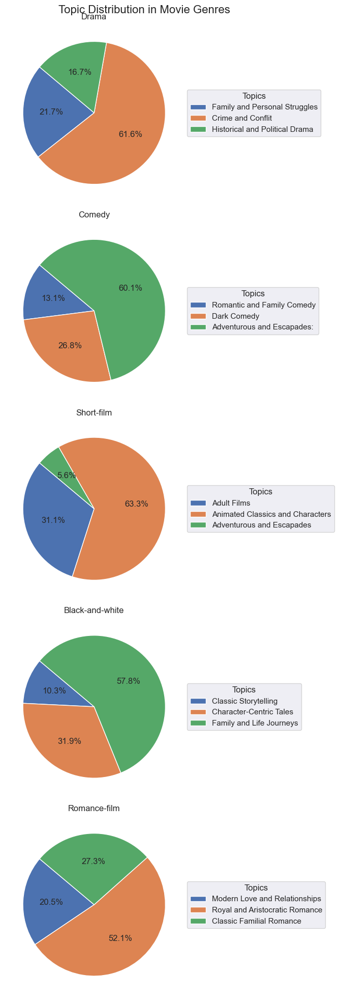

In [48]:
topics = {"Drama": ["Family and Personal Struggles", "Crime and Conflit", "Historical and Political Drama"],
            "Comedy": ["Romantic and Family Comedy", "Dark Comedy", "Adventurous and Escapades:"],
            "Short-film": ["Adult Films", "Animated Classics and Characters", "Adventurous and Escapades"],
            "Black-and-white": ["Classic Storytelling", "Character-Centric Tales", "Family and Life Journeys"],
            "Romance-film": ["Modern Love and Relationships", "Royal and Aristocratic Romance", "Classic Familial Romance"]}


# Plotting the pie charts in a vertical layout
fig, axes = plt.subplots(5, 1, figsize=(6, 20))  # Adjusted layout to vertical and size
fig.suptitle('Topic Distribution in Movie Genres', fontsize=16)

for i, (genre, counts) in enumerate(genre_topic_counts.items()):
    wedges, texts, autotexts = axes[i].pie(counts, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(genre)
    axes[i].legend(wedges, topics[genre], title="Topics", loc="center left", bbox_to_anchor=(1, 0, 0.5, 1))

plt.tight_layout()
plt.show()

# Stars (Antoine's Part)

In [49]:
import helpers


movies,characters = helpers.import_movies_data("./data")


/Users/antoineschutz/Desktop/untitled folder/ada-2023-project-zalix-main 2/helpers.py:73: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



In [50]:
characters = characters[characters["freebase_actor_ID"].notna()]


In [51]:
Movies_characters_merge = pd.merge(movies,characters,on=["wikipedia_movie_ID", "freebase_movie_ID"])


Movies_characters_merge.head(5)



,wikipedia_movie_ID,freebase_movie_ID,movie_name,movie_release_date,movie_box_office_revenue,movie_runtime,movie_languages,movie_countries,movie_genres,year_released,...,character_name,actor_DOB,actor_gender,actor_height,actor_ethnicity,actor_name,actor_age_at_movie_release,freebase_character/actor_map_ID,freebase_character_ID,freebase_actor_ID
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,...,Akooshay,1958-08-26,F,1.620,NaN,Wanda De Jesus,42.0,/m/0bgchxw,/m/0bgcj3x,/m/03wcfv7
1,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,...,Lieutenant Melanie Ballard,1974-08-15,F,1.780,/m/044038p,Natasha Henstridge,27.0,/m/0jys3m,/m/0bgchn4,/m/0346l4
2,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,...,Desolation Williams,1969-06-15,M,1.727,/m/0x67,Ice Cube,32.0,/m/0jys3g,/m/0bgchn_,/m/01vw26l
3,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,...,Sgt Jericho Butler,1967-09-12,M,1.750,NaN,Jason Statham,33.0,/m/02vchl6,/m/0bgchnq,/m/034hyc
4,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science...",2001,...,Bashira Kincaid,1977-09-25,F,1.650,NaN,Clea DuVall,23.0,/m/02vbb3r,/m/0bgchp9,/m/01y9xg


Now , we need to make sure that an actor appears only once in a Movie

In [52]:
dup = Movies_characters_merge[Movies_characters_merge.duplicated(subset=["wikipedia_movie_ID","freebase_actor_ID"],keep=False)]
dup.head(5)

,wikipedia_movie_ID,freebase_movie_ID,movie_name,movie_release_date,movie_box_office_revenue,movie_runtime,movie_languages,movie_countries,movie_genres,year_released,...,character_name,actor_DOB,actor_gender,actor_height,actor_ethnicity,actor_name,actor_age_at_movie_release,freebase_character/actor_map_ID,freebase_character_ID,freebase_actor_ID
45,77856,/m/0kcn7,Mary Poppins,1964-08-27,102272727.0,139.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/0hj3myq"": ""Children's/Family"", ""/m/04t36""...",1964,...,Bert,1925-12-13,M,1.85,/m/07mqps,Dick Van Dyke,38.0,/m/0k0gyy,/m/05gkznp,/m/01vb403
47,77856,/m/0kcn7,Mary Poppins,1964-08-27,102272727.0,139.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/0hj3myq"": ""Children's/Family"", ""/m/04t36""...",1964,...,Mr. Dawes Senior,1925-12-13,M,1.85,/m/07mqps,Dick Van Dyke,38.0,/m/0h12l69,/m/0h12l6c,/m/01vb403
534,6004372,/m/0fk60h,Grace of My Heart,1996-09-08,617632.0,116.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/09glv8x"": ""Film \u00e0 clef"", ""/m/04xvlr""...",1996,...,Denise Waverly,1965-07-25,F,1.74,NaN,Illeana Douglas,31.0,/m/0jyzlg,/m/0h5m7zm,/m/01pg1d
535,6004372,/m/0fk60h,Grace of My Heart,1996-09-08,617632.0,116.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/09glv8x"": ""Film \u00e0 clef"", ""/m/04xvlr""...",1996,...,Edna Buxton,1965-07-25,F,1.74,NaN,Illeana Douglas,31.0,/m/0hmzb_v,/m/0hmzb_y,/m/01pg1d
735,20694087,/m/051w_vb,Kanden Kadhalai,2009-10-30,NaN,NaN,"{""/m/07c9s"": ""Tamil Language""}","{""/m/03rk0"": ""India""}","{""/m/02l7c8"": ""Romance Film"", ""/m/01z4y"": ""Com...",2009,...,Mayil Vaganam,1953-06-04,M,NaN,/m/0dryh9k,Manobala,56.0,/m/0hb4c_j,/m/0hb4czd,/m/06zmg7m


Exemple : In the movie Mary poppins the actor Dick Van Dyke plays Bert and Mr. Dawes Senior	

In [53]:
Movies_characters_merge = Movies_characters_merge.drop_duplicates(subset=["wikipedia_movie_ID","freebase_actor_ID"])
print("We have",Movies_characters_merge.shape[0],"Combinations of Movies+actor")

We have 105389 Combinations of Movies+actor


In [54]:
unique_movies = len(Movies_characters_merge["freebase_movie_ID"].unique())
unique_actors = len(Movies_characters_merge["freebase_actor_ID"].unique())


print("There are",unique_movies,"unique movies and",unique_actors,"unique actors")



There are 12570 unique movies and 46250 unique actors


### Numbers of Actors in movies , and Number of Movies played by actors

In [55]:
import matplotlib.pyplot as plt

actor_movies_count = Movies_characters_merge.groupby("freebase_actor_ID")["freebase_movie_ID"].nunique().reset_index()
actor_movies_count.columns = ['Actor_id', 'Number_of_Movies']



actor_movies_count

,Actor_id,Number_of_Movies
0,/m/010p3,2
1,/m/010xjr,9
2,/m/0112yl,3
3,/m/011_3s,8
4,/m/011_8,3
...,...,...
46245,/m/0ywqc,37
46246,/m/0z05l,7
46247,/m/0z4s,34
46248,/m/0zcb7,1


count    46250.000000
mean         2.278681
std          3.261078
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        100.000000
Name: Number_of_Movies, dtype: float64
1.0


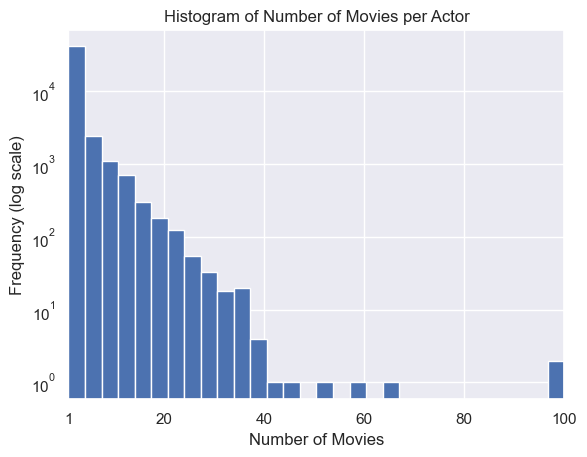

In [56]:
print(actor_movies_count['Number_of_Movies'].describe())

print(actor_movies_count['Number_of_Movies'].quantile(0.65))


plt.hist(actor_movies_count['Number_of_Movies'],bins=30,log=True)
plt.xlabel('Number of Movies')
plt.ylabel('Frequency (log scale)')
plt.title('Histogram of Number of Movies per Actor')
plt.xlim(1, 100) #Starting at 1 , since each actor in that dataset played in at least 1 movie
plt.xticks([1, 20, 40, 60, 80, 100])
plt.show()

### Comment

We can see that most actors in the dataset played in only 1 Movies.

In order to do our analysis , we need to keep actors that played in multiple Movies.

count    12570.000000
mean         8.384169
std          6.080858
min          1.000000
25%          3.000000
50%          8.000000
75%         12.000000
max        115.000000
Name: Number_of_actors, dtype: float64


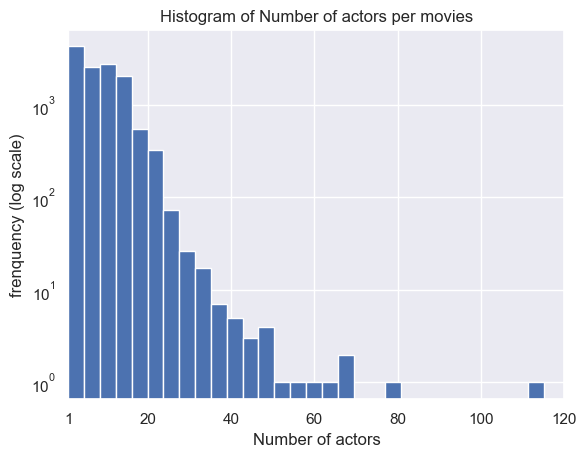

In [57]:
movies_actor_count = Movies_characters_merge.groupby("freebase_movie_ID")["freebase_actor_ID"].nunique().reset_index()
movies_actor_count.columns = ['Movies_id', 'Number_of_actors']



print(movies_actor_count['Number_of_actors'].describe())




plt.hist(movies_actor_count['Number_of_actors'],bins=30,log=True)
plt.title("Histogram of Number of actors per movies")
plt.xlabel("Number of actors")
plt.ylabel("frenquency (log scale)")
plt.xlim(1, 120) #Starting at 1 , since each movies in the dataset has at least 1 actor in it 

plt.xticks([1, 20, 40, 60, 80, 100,120])
plt.show()

### Comment

We see that there are 8 actors on average on a Movie.

# Filtering Actors with Not enough Films

In [58]:
actors_with_at_least_10_movies = actor_movies_count[actor_movies_count.Number_of_Movies>10]
actors_with_at_least_20_movies = actor_movies_count[actor_movies_count.Number_of_Movies>20]
actors_with_at_least_35_movies = actor_movies_count[actor_movies_count.Number_of_Movies>35] 



print("There are ",actors_with_at_least_10_movies.shape[0],"actors with at least 10 films, ",actors_with_at_least_20_movies.shape[0],"actors with at least 20 films and ",actors_with_at_least_35_movies.shape[0],"actors with at least 35 films")



Movies_characters_merge_10movies = Movies_characters_merge[Movies_characters_merge["freebase_actor_ID"].isin(actors_with_at_least_10_movies.Actor_id.values)]
Movies_characters_merge_20movies = Movies_characters_merge[Movies_characters_merge["freebase_actor_ID"].isin(actors_with_at_least_20_movies.Actor_id.values)]
Movies_characters_merge_35movies = Movies_characters_merge[Movies_characters_merge["freebase_actor_ID"].isin(actors_with_at_least_35_movies.Actor_id.values)]




#Sanity check : 
unique_actors_10 = len(Movies_characters_merge_10movies["freebase_actor_ID"].unique())
unique_actors_20 = len(Movies_characters_merge_20movies["freebase_actor_ID"].unique())
unique_actors_35 = len(Movies_characters_merge_35movies["freebase_actor_ID"].unique())

unique_actors_10,unique_actors_20,unique_actors_35

There are  1450 actors with at least 10 films,  260 actors with at least 20 films and  18 actors with at least 35 films


(1450, 260, 18)

We observe that there are 260 actors who played in at least 260 films , this will be enough to perfom a linear regression to investigate the evolution of movie ratings for star actors 

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     11.05
Date:                Thu, 21 Dec 2023   Prob (F-statistic):           0.000890
Time:                        19:56:26   Log-Likelihood:                -9012.7
No. Observations:                7014   AIC:                         1.803e+04
Df Residuals:                    7012   BIC:                         1.804e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         8.7147      0.705     12.369

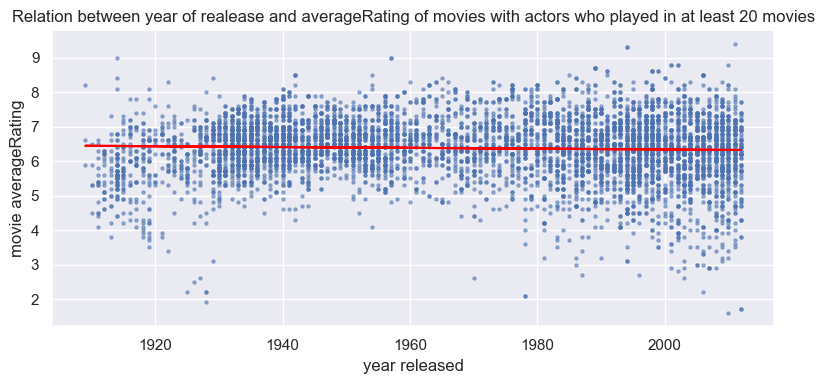

In [59]:
#perform linear regression, and plot the regression line
model=smf.ols(formula='averageRating ~ year_released', data=Movies_characters_merge_20movies)
results=model.fit()
print(results.summary())

plt.figure(figsize=(8, 4))
plt.scatter(Movies_characters_merge_20movies["year_released"], Movies_characters_merge_20movies["averageRating"], alpha=0.5, s=5)

plt.plot(Movies_characters_merge_20movies["year_released"], results.predict(), color="red")
plt.title("Relation between year of realease and averageRating of movies with actors who played in at least 20 movies")
plt.xlabel("year released")
plt.ylabel("movie averageRating")

plt.tight_layout()


plt.show()

# Visualisation of the Evolution of ratings for 5 random actors

In [60]:
import random


actorsId_20movies = Movies_characters_merge_20movies["freebase_actor_ID"].tolist() #List all actors that played in at least 20 movies
selected_actors = random.sample(actorsId_20movies, k=5) #Select 5 actors out of that list


Movies_characters_selected = Movies_characters_merge_20movies[Movies_characters_merge_20movies["freebase_actor_ID"].isin(selected_actors)] #


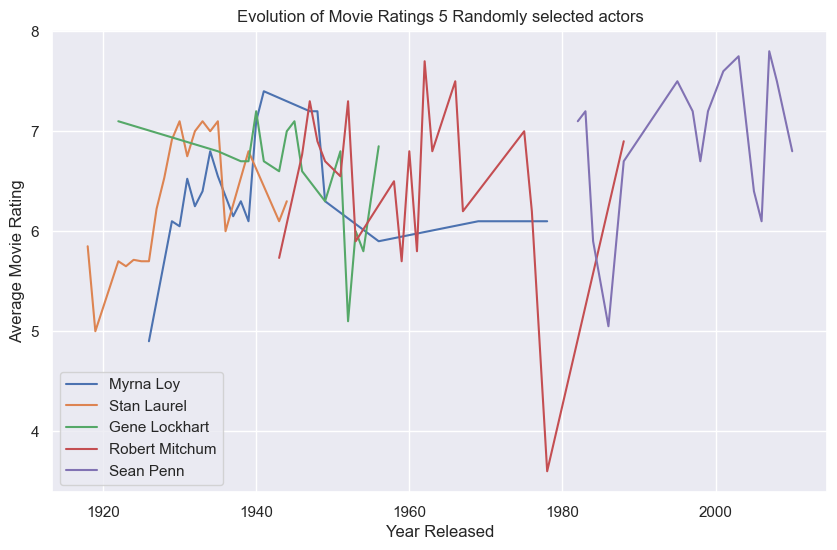

In [61]:
average_ratings_by_actor_year = Movies_characters_selected.groupby(['freebase_actor_ID','actor_name', 'year_released'])['averageRating'].mean().reset_index()

# Plotting the evolution of movie ratings across the years for all actors
plt.figure(figsize=(10, 6))

# Iterate through each actor, calculate their ratings over the years, and plot
for actor_id, actor_group in average_ratings_by_actor_year.groupby(['freebase_actor_ID',"actor_name"]):
    plt.plot(actor_group['year_released'], actor_group['averageRating'], label=actor_id[1])

# Set plot labels and title
plt.xlabel('Year Released')
plt.ylabel('Average Movie Rating')
plt.title('Evolution of Movie Ratings 5 Randomly selected actors')
plt.legend()  # Show legend with actor IDs

# Show the plot
plt.grid(True)
plt.show()

## Relation between year of realease and averageRating for actors with at least 20 movies

                            OLS Regression Results                            
Dep. Variable:          averageRating   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     3.006
Date:                Thu, 21 Dec 2023   Prob (F-statistic):             0.0842
Time:                        19:56:27   Log-Likelihood:                -63.412
No. Observations:                 260   AIC:                             130.8
Df Residuals:                     258   BIC:                             137.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 8.85

Text(1940, 5.25, 'Slope: -0.0013')

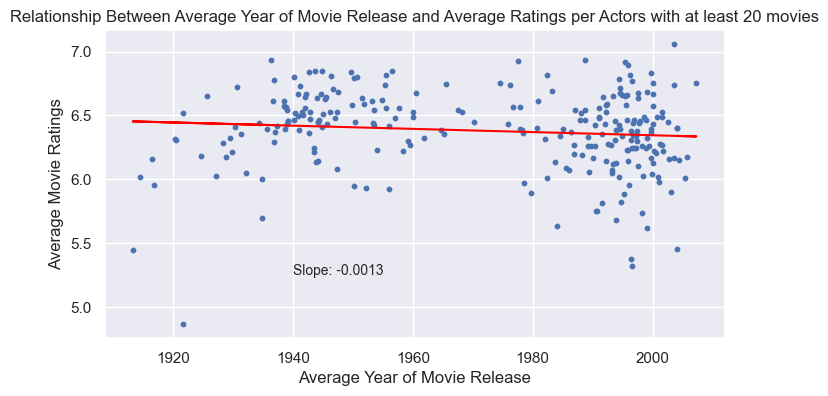

In [62]:
best_actors = Movies_characters_merge_20movies.groupby(["freebase_actor_ID","actor_name"]).agg({
    'averageRating': 'mean',
    'year_released': 'mean'
}).reset_index()

best_actors.sort_values(by="averageRating",ascending=False)

best_actors.columns=["freebase_actor_ID","actor_name","averageRating","average_year_realease"]

model=smf.ols(formula='averageRating ~ average_year_realease', data=best_actors)
results=model.fit()
print(results.summary())

plt.figure(figsize=(8, 4))
plt.scatter(best_actors["average_year_realease"], best_actors["averageRating"],s=10)

plt.plot(best_actors["average_year_realease"], results.predict(), color="red")
plt.title("Relationship Between Average Year of Movie Release and Average Ratings per Actors with at least 20 movies")
plt.xlabel("Average Year of Movie Release")
plt.ylabel("Average Movie Ratings")
# Add coefficient information to the graph
coefficient_per_year = results.params['average_year_realease']
plt.text(1940,5.25,f"Slope: {coefficient_per_year:.4f}", fontsize=10)



Now , we want to see if they're any correlation between the precense of star actors and the rating of movies ,for this , we will perform a linear Regression.<br>
This time , we will restrict ourselve to actors who played in at least 35 movies, so that the effect observed can be significant 

Reminder , there are 18 actors who played in at least 35 movies

In [63]:
Actors_with_at_least_35_movies_dummy = pd.get_dummies(data=Movies_characters_merge_35movies,columns=["freebase_actor_ID"],dtype=int)


formula = "averageRating ~ "

for ch in ['/', ' ', "'", '-']:
    Actors_with_at_least_35_movies_dummy.columns = Actors_with_at_least_35_movies_dummy.columns.str.replace(ch, "")

for col in Actors_with_at_least_35_movies_dummy.columns:
    if col.startswith("freebase_actor"):
        formula += "C("+col+")+"

formula  = formula[:-1]

model = smf.ols(formula=formula, data=Actors_with_at_least_35_movies_dummy)
res = model.fit()
res_summary = res.summary()

In [64]:
res.rsquared

0.10568121274096953

The R-squared is quite low , but the formula for the linear regression only included information about actors , and nothing about genre / runtime / budget ...

In [65]:
results_as_html = res_summary.tables[1].as_html()

# Convert to pandas DataFrames
summary_df = pd.read_html(results_as_html, header=0, index_col=0)[0]


# We keep only Rows where P>|t| is <0.05 , to keep only significant data 
summary_df = summary_df[summary_df["P>|t|"]<=0.05]


# now that we only have Rows with significant data , we can sort by coef to see the most impactful actor

summary_df.sort_values(by="coef",ascending=False)

summary_df = summary_df.reset_index()
summary_df.rename(columns={'index': 'freebase_actor_ID'}, inplace=True)



summary_df = summary_df.drop(0)

#Reconverting Freebase_actor_id into the correct format 

summary_df['freebase_actor_ID'] = summary_df['freebase_actor_ID'].str.split('ID_').str[-1].str.split('\)\[T.1').str[0]

summary_df["freebase_actor_ID"] = "/m/"+summary_df["freebase_actor_ID"].str[1:]

summary_df


/var/folders/9_/z1m27wy57j34pk1k36dtbd280000gn/T/ipykernel_3619/3065806165.py:4: FutureWarning:

Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.



,freebase_actor_ID,coef,std err,t,P>|t|,[0.025,0.975]
1,/m/012vf6,0.4375,0.124,3.517,0.000,0.193,0.682
2,/m/01v3bn,0.4990,0.124,4.012,0.000,0.255,0.743
3,/m/01ycbq,0.4413,0.128,3.460,0.001,0.191,0.692
4,/m/02gf_l,0.3253,0.129,2.517,0.012,0.072,0.579
5,/m/03mv0b,0.2970,0.098,3.035,0.002,0.105,0.489
6,/m/0c2tf,0.5927,0.128,4.647,0.000,0.342,0.843
7,/m/0c5vh,0.7510,0.081,9.329,0.000,0.593,0.909
8,/m/0cgbf,-0.2869,0.110,-2.619,0.009,-0.502,-0.072
9,/m/0f5xn,0.2785,0.124,2.239,0.025,0.034,0.523
10,/m/0gnbw,0.4809,0.129,3.721,0.000,0.227,0.735


In [66]:
Movies_characters_merge_35movies.columns


Index(['wikipedia_movie_ID', 'freebase_movie_ID', 'movie_name',
       'movie_release_date', 'movie_box_office_revenue', 'movie_runtime',
       'movie_languages', 'movie_countries', 'movie_genres', 'year_released',
       'tconst', 'averageRating', 'numVotes', 'last_update', 'character_name',
       'actor_DOB', 'actor_gender', 'actor_height', 'actor_ethnicity',
       'actor_name', 'actor_age_at_movie_release',
       'freebase_character/actor_map_ID', 'freebase_character_ID',
       'freebase_actor_ID'],
      dtype='object')

In [67]:
merged_top_actors = pd.merge(summary_df,Movies_characters_merge_35movies[['freebase_actor_ID', 'actor_name']],how='left', left_on='freebase_actor_ID', right_on='freebase_actor_ID')



merged_top_actors = merged_top_actors.groupby("freebase_actor_ID").first().reset_index()



merged_top_actors = merged_top_actors.sort_values(by="coef",ascending=False)
merged_top_actors

,freebase_actor_ID,coef,std err,t,P>|t|,[0.025,0.975],actor_name
10,/m/0h1m9,0.8281,0.129,6.408,0.000,0.574,1.082,Bette Davis
6,/m/0c5vh,0.7510,0.081,9.329,0.000,0.593,0.909,Mel Blanc
5,/m/0c2tf,0.5927,0.128,4.647,0.000,0.342,0.843,Gary Cooper
1,/m/01v3bn,0.4990,0.124,4.012,0.000,0.255,0.743,Robert Taylor
13,/m/0ywqc,0.4927,0.128,3.863,0.000,0.242,0.743,Donald Sutherland
9,/m/0gnbw,0.4809,0.129,3.721,0.000,0.227,0.735,Michael Caine
2,/m/01ycbq,0.4413,0.128,3.460,0.001,0.191,0.692,Christopher Plummer
0,/m/012vf6,0.4375,0.124,3.517,0.000,0.193,0.682,Myrna Loy
3,/m/02gf_l,0.3253,0.129,2.517,0.012,0.072,0.579,Frank Welker
4,/m/03mv0b,0.2970,0.098,3.035,0.002,0.105,0.489,Stan Laurel


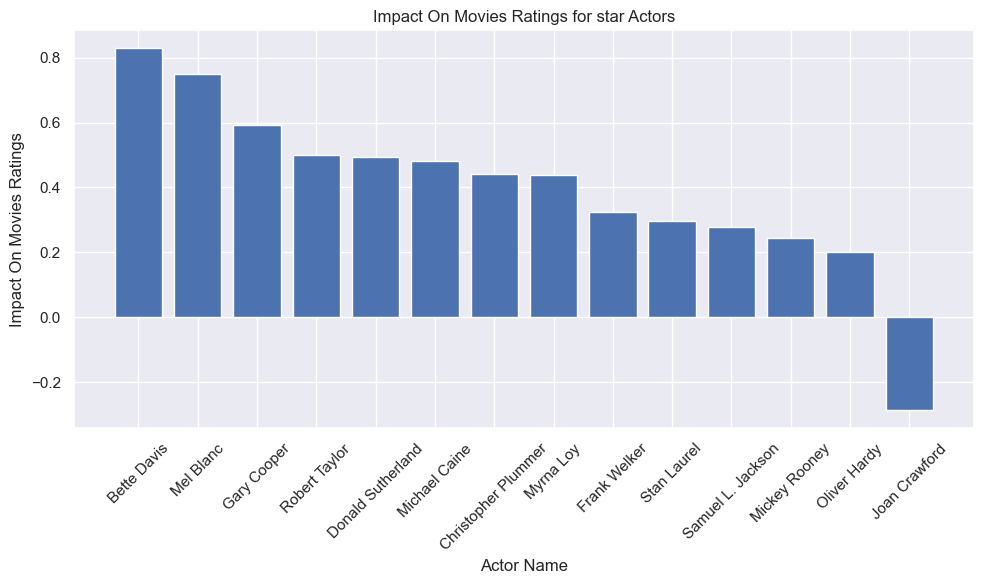

In [68]:
plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
plt.bar(merged_top_actors['actor_name'], merged_top_actors['coef'])
plt.xlabel('Actor Name')
plt.ylabel('Impact On Movies Ratings')
plt.title('Impact On Movies Ratings for star Actors')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()


Among the 18 actors who appeared in at least 35 movies, we observe that 14 of them have a significant influence on the ratings of the movies in which they were involved.

For the most impactful among them, their participation in movies generally leads to an increase in ratings by almost a point.

# Diversity : Zach's Part

### Data Preprocessing

In [69]:
movies, characters = helpers.import_movies_data("./data/")
# NOTE: drop entry if either side is missing 
# NOTE: a movie has multiple actors and thus multiple rows
df_by_actors = pd.merge(movies, characters, how='inner', on=['wikipedia_movie_ID'])

print(df_by_actors.shape)

/Users/antoineschutz/Desktop/untitled folder/ada-2023-project-zalix-main 2/helpers.py:73: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



(106354, 25)


In [70]:
# NOTE: keep data till 2009 (2010 - 2013 dropped: incomplete decade)
df_by_actors = df_by_actors[df_by_actors['year_released'] <= 2009]

# add decade column
df_by_actors['decade'] = df_by_actors['year_released'].apply(lambda x: int(x/10)*10)

# rename rating column
df_by_actors = df_by_actors.rename(columns={'averageRating': 'imdb_rating'})

In [71]:
# create a data frame of unique films 
df_by_films = df_by_actors.drop_duplicates(subset=['wikipedia_movie_ID']).reset_index().set_index('wikipedia_movie_ID').copy()

In [72]:
# compute # cast ethnicities per film
# NOTE: ignore missing values in ethnicity columns 
# NOTE: fill NaN with 1 after tallying 
n_ethnicities_per_film = df_by_actors.groupby(['wikipedia_movie_ID'])['actor_ethnicity'].nunique().replace(0, 1)

# add # cast ethnicities column
df_by_films['num_ethnicities'] = n_ethnicities_per_film

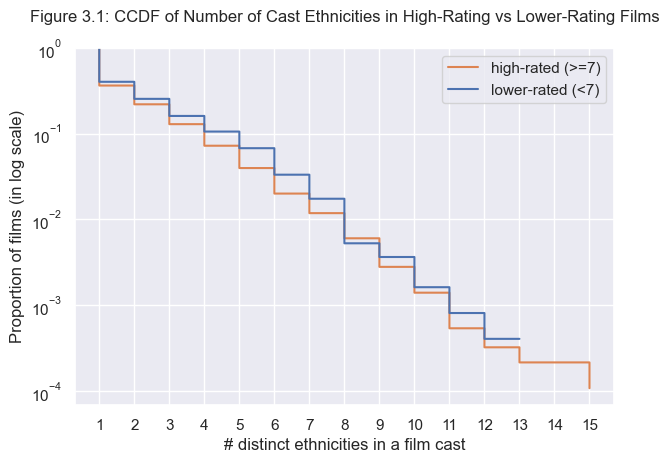

In [73]:
# 1. distribution of # cast ethnicities among good vs non-good films => show ethnic diversity as a potentially interesting factor in film rating


# plot CDF of # cast ethnicities ~ proportion between good vs non-good films
df_by_films['good'] = df_by_films['imdb_rating'] >= 7.0
# NOTE: close curves but good films curve almost always above (greater proportion > x) non-good => good films have greater ethnic diversity in cast in general 
ax = sns.ecdfplot(data=df_by_films, x="num_ethnicities", hue="good", hue_order=[1, 0], complementary=True, log_scale=[False, True])
ax.set_xlabel('# distinct ethnicities in a film cast')
ax.set_ylabel('Proportion of films (in log scale)')
ax.set_title('Figure 3.1: CCDF of Number of Cast Ethnicities in High-Rating vs Lower-Rating Films', y=1.05)
ax.legend(['high-rated (>=7)', 'lower-rated (<7)'])
# x-axis displays all values
xticks = np.arange(1, df_by_films['num_ethnicities'].max() + 1)
plt.xticks(xticks)

plt.tight_layout()

<!-- exploratory analysis: ethnic diversity as an interesting factor to set the stage 
    - [x] expect good films to have a higher proportion of films with greater ethnic diversity among cast -->

Hollywood, and many major film studios around the world, have long faced criticism for the lack of racial diversity in its workforce both on and off the screens. In recent decades, there has also been a growing call for greater representation of racial minorities on the silver screen. [Figure X] shows a quick exploratory analysis of the distribution of the number of ethnicities among cast members of each film between 1900 to 2009. As shown in the figure, the curve representing films rated 7 or above is consistently higher than that of films rated below. This suggests that highly rated films generally have more ethnically diverse casts than those lower rated. 

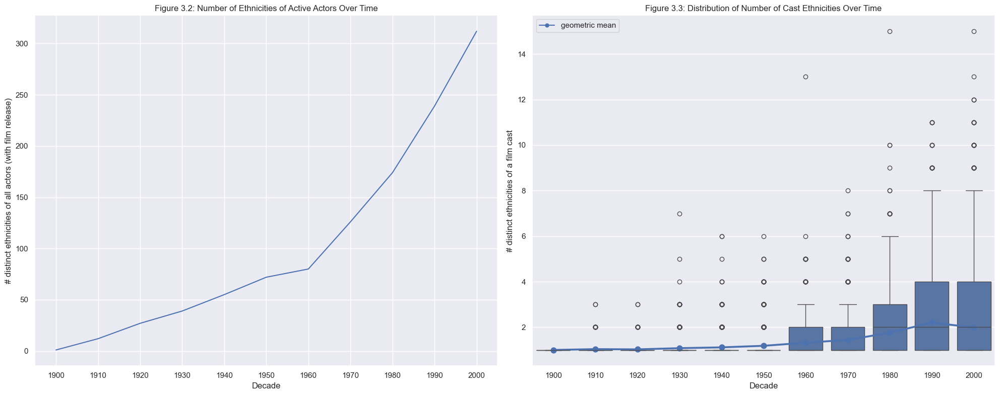

In [74]:
# 2. ethnic demographic change among actors (# actor ethnicities) over time AND ethnic diversity change among cast/on-screen (# cast ethnicities) over time 

# compute # distinct ethnicities among actors for each decade
# NOTE: ignore missing values in ethnicity column
n_actor_ethnicities_by_decade = pd.crosstab(df_by_actors['decade'], df_by_actors['actor_ethnicity']).apply(lambda x: (x != 0).sum(), axis=1)

decades = np.sort(df_by_films['decade'].unique())

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# plot decade ~ # distinct actor ethnicities across all films
sns.lineplot(n_actor_ethnicities_by_decade, ax=ax1)
# Add title for the plot
ax1.set_title('Figure 3.2: Number of Ethnicities of Active Actors Over Time')
ax1.set_xlabel('Decade')
ax1.set_ylabel('# distinct ethnicities of all actors (with film release)')
ax1.set_xticks(decades)

# plot decade ~ (distribution) # actor ethnicities per film + geometric mean
# NOTE: # ethnicities among cast follows power law distribution => use robust statistics
sns.boxplot(df_by_films, x='decade', y='num_ethnicities', ax=ax2)
sns.pointplot(df_by_films, x='decade', y='num_ethnicities', estimator=stats.gmean, errorbar=None, ax=ax2)
ax2.set_ylabel('# distinct ethnicities of a film cast')
ax2.set_xlabel('Decade')
ax2.set_title('Figure 3.3: Distribution of Number of Cast Ethnicities Over Time')

from matplotlib.lines import Line2D

legend_elements = [Line2D([0], [0], marker='o', color='b', label='geometric mean', markerfacecolor='b', markersize=5)]
ax2.legend(handles=legend_elements)

plt.tight_layout()

<!-- ethnic demographic change among actors (# actor ethnicities) over time AND ethnic diversity change among cast/on-screen (# cast ethnicities) over time 
    - [x] expect upward trends in both => shift in actor ethnic demographics reflected by greater ethnic representation on screen -->

To set the stage, let's first take a look at how the ethnic demographic of actors has evolved globally over time. [Figure X] shows that the 110-year history of film-making has witnessed a booming growth in the ethnic background of actors, with the trend accelarating after 1960s. 

This fast diversifying shift in the acting workforce is reflected on the silver screen, through greater, though much more subdued, ethnic representation by the collective featuring of actors from different ethnic background in the same films. 

In [Figure X], for the first half of the century, nearly all films' casts have remained dominated by a single ethnicity, as both the average and the spread remained thin. [Figure X] above reveals that the number of cast ethnicities follows power law distribution. [Figure X] therefore measures its average across films in each decade by its geometric mean. 

Since 1960s, however, the average cast ethnicity has slowly climbed, reaching 2 for the first time in 1900s and revearsing its trend slightly at the turn of the century. In the backdrop of a widening spread, more and more films have joined to cast more actors from different ethnic groups during this period, with half of the films featuring actors from at least 2 ethnic groups and a quater of films featuring more than 3 since 1980s. 

Although most films' casts have stayed ethnically homogeneous, there has always been some outlier films throughout history with much more ethnically diverse cast, potentially paving the way for further diversification in the future.

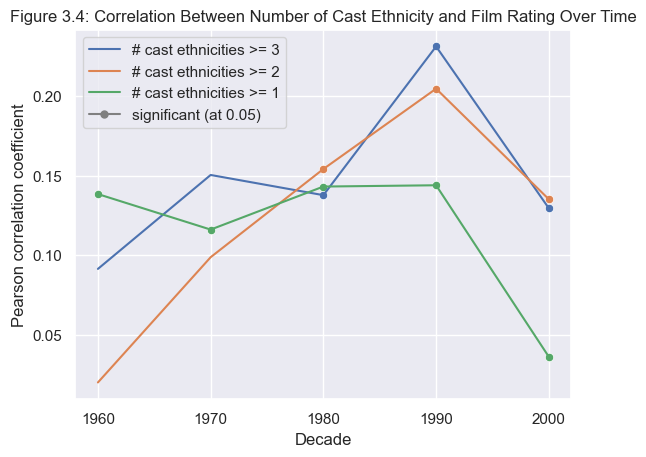

In [75]:
# 3. correlation between cast’s ethnic diversity and film rating over time 

# NOTE: begin from 1960s (before almost all films num_ethnicities = 1)
df_by_films = df_by_films[df_by_films['decade'] >= 1960].copy()

# compute the correlation coefficient of # cast ethnicities and film rating for each decade

fig, ax = plt.subplots()
# plot decade ~ # cast ethnicities and film rating correlation coefficient
for n in range(3, 0, -1):
  cor_by_decade = df_by_films[df_by_films['num_ethnicities'] >= n].groupby('decade').apply(lambda x: stats.pearsonr(x['num_ethnicities'], x['imdb_rating']))
  coef = cor_by_decade.apply(lambda x: x[0])
  p_val = cor_by_decade.apply(lambda x: x[1])

  axis = sns.lineplot(coef, ax=ax, label=f'# cast ethnicities >= {n}')
  # mark significant coefficients
  line_color = axis.get_lines()[-1].get_color()
  sns.scatterplot(coef[p_val <= 0.05], ax=ax, color=line_color)

ax.set_xticks(decades[-5:])
ax.set_xlabel('Decade')
ax.set_ylabel("Pearson correlation coefficient")
ax.set_title("Figure 3.4: Correlation Between Number of Cast Ethnicity and Film Rating Over Time")

marker_legend = Line2D([0], [0], marker='o', color='grey', markerfacecolor='grey', markersize=5, label='significant (at 0.05)')

handles, labels = ax.get_legend_handles_labels()
handles.append(marker_legend)
ax.legend(handles=handles)


<!-- correlation: more ethnically diverse films more well-received/higher rating
    - [ ] ethnic diversity associated/appreciated more? 

- explore cast's ethnic diversity associated with higher rating (vs influence later)
- cut-off from 1960s onwards based on spread in distribution

- generally small but positive correlation throughout
- strongest correlation at num_ethnicities >= 3 tier & 3 ethnicities as minimum threshold for an ethnically diverse cast  -->

History has shown that actors from increasingly diverse ethnic backgrounds are getting film roles and seen on the movie screens. However, are the audience appreciating this? To examine how ethnic diversity impacts a film's overall perceived quality by the audience and also how this impact has changed over time, we analyze the relationship between a film's cast ethnic diversity and its audience ratings. Tieing into the concept of 'representation', the ethnic diversity of a film is measured by the total number of different ethnicities among actors in a film's cast as seen directly by audiences on the movie screen. Film quality as perceived by the audiences is captured by the overall weighted average score of all user ratings on IMDB. As the vast majority of films consist of actors with identical ethnicity until 1950s, 1960s is chosen at the period to begin the analysis. 

In general, there is a small but positive correlation between a film's cast ethnic diversity and rating. As shown in [Figure X] at various levels, across decades, the more ethnically diverse the cast, the higher the film rating. This correlation, measured by the Pearson Correlation Coefficient, is the strongest at the diversity level where only films featuring actors from at least 3 different ethnic groups are considered. We therefore uses this as a threshold to split films into ethnically diverse and non-diverse groups to continue the analysis. This threshold makes sense because in a country with one dominant ethnic group, it makes sense to see at least two minority ethnic group also featured to qualify as 'diverse'.

This begs the question - does an ethnically diverse cast lead to a more highly-rated film? Let's dive in. 

In [76]:
# build regression model for propensity matching on ethnic diversity


# feature selection
# use observed covariates: movie_release_date, movie_languages, movie_countries, movie_genres
df_by_films['ethnic_diverse'] = df_by_films['num_ethnicities'] >= 3

df_reg = df_by_films[['movie_release_date', 'movie_languages', 'movie_countries', 'movie_genres', 'ethnic_diverse', 'decade']].copy()

# data preprocessing
# handle missing values: drop rows
df_reg = df_reg.replace('{}', np.nan)

print(df_reg.isna().sum(axis=0) / df_reg.shape[0])

old_shape = df_reg.shape
df_reg = df_reg.dropna()
# NOTE: dropped 7.5% rows
print(old_shape, df_reg.shape, df_reg.shape[0] / old_shape[0])


movie_release_date    0.000000
movie_languages       0.051084
movie_countries       0.025610
movie_genres          0.007724
ethnic_diverse        0.000000
decade                0.000000
dtype: float64
(7380, 6) (6872, 6) 0.9311653116531166


In [77]:
# feature encoding
# split movie_release_date to year, month, day & standardize
release = pd.to_datetime(df_reg['movie_release_date'])
release_date = pd.DataFrame({'year': release.dt.year, 'month': release.dt.month, 'day': release.dt.day})
release_date_std = StandardScaler().fit_transform(release_date)

# extract movie_languages values & one-hot encode
languages = df_reg['movie_languages'].apply(lambda x: list(ast.literal_eval(x).values()))
languages_encoded = languages.str.join('|').str.get_dummies()

# extract movie_countries values & one-hot encode
countries = df_reg['movie_countries'].apply(lambda x: list(ast.literal_eval(x).values()))
countries_encoded = countries.str.join('|').str.get_dummies()

# extract movie_genres values & one-hot encode
genres = df_reg['movie_genres'].apply(lambda x: list(ast.literal_eval(x).values()))
genres_encoded = genres.str.join('|').str.get_dummies()


In [78]:
# model fitting 
# predict each film's probability of being ethnically diverse 
X = np.concatenate((release_date_std, languages_encoded, countries_encoded, genres_encoded), axis=1)
Y = df_reg['ethnic_diverse']
# NOTE: unbalanced dataset => class_weight=balanced
prob = LogisticRegression(random_state=12, solver='lbfgs', max_iter=1000, class_weight='balanced').fit(X, Y).predict_proba(X)[:, 1]

In [79]:
# propensity matching 

def find_matching(treated, control):
  G = nx.Graph()
  # add edges between treated and control
  for ti, t in treated.iterrows():
    for ci, c in control.iterrows():
      # match on similarity of propensity
      similarity = np.abs(t["propensity"] - c["propensity"])
      G.add_weighted_edges_from([(ti, ci, similarity)])
  # find optimal matching approximation (performance)
  return nx.approximation.min_maximal_matching(G)

def find_matching_for_decade(x):
  start = time.time()
  matching = find_matching(x[x['ethnic_diverse']], x[~x['ethnic_diverse']])
  end = time.time()
  print(f'decade: {x["decade"].iloc[0]}, time: {end - start}s')
  return matching

df_reg['propensity'] = prob
# match by each decade separately (performance)
matching_by_decade = df_reg.groupby('decade').apply(lambda x: find_matching_for_decade(x))

decade: 1960, time: 1.2142047882080078s
decade: 1970, time: 1.6550157070159912s
decade: 1980, time: 5.582464218139648s
decade: 1990, time: 11.581961870193481s
decade: 2000, time: 37.12547302246094s


In [80]:
# get indices of matched films
matches = np.array([list(pair) for matching in matching_by_decade.values for pair in matching]).flatten()

print([len(matching) for matching in matching_by_decade.values])
print(len(matches))

[98, 143, 369, 747, 1150]
5014


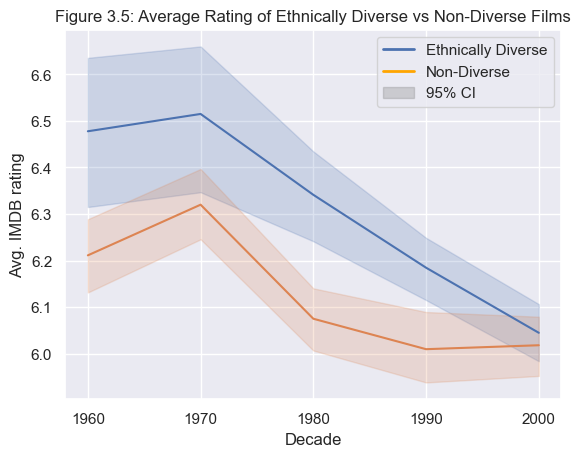

In [81]:
# 4. average rating of ethnically diverse films vs ethnically non-diverse films 

from matplotlib.patches import Patch

fig, ax1 = plt.subplots()

# plot decade ~ avg rating of ethnically diverse films (treated) vs ethnically non-diverse films (control)
sns.lineplot(df_by_films, x='decade', y='imdb_rating', hue='ethnic_diverse', errorbar='ci', hue_order=[True, False], ax=ax1)

ax1.set_title('Figure 3.5: Average Rating of Ethnically Diverse vs Non-Diverse Films')
ax1.set_xticks(decades[-5:])
ax1.set_xlabel('Decade')
ax1.set_ylabel('Avg. IMDB rating')

legend_elements = [Line2D([0], [0], color='b', lw=2, label='Ethnically Diverse'),
                   Line2D([0], [0], color='orange', lw=2, label='Non-Diverse'),
                   Patch(facecolor='grey', edgecolor='grey', label='95% CI', alpha=0.3)]
ax1.legend(handles=legend_elements)

<!-- correlation: more ethnically diverse films more well-received/higher rating

    - [ ] ethnic diversity associated/appreciated more/higher correlation in recent decades? 
    - [ ] raise question: ethnically diverse cast contributes to higher rating? 

causation & significance: greater ethnic diversity in cast influence/leads to higher rating
    - [ ] expect yes in recent decades where greater ethnic representation translates to higher rating/audience appreciation 


- ethnically diverse films average rating consistently higher, with overlapping ci in 1970s and 2000s
- after pair matching, still the case: 3 statiscally significant difference in means out of 5 decades => presence of influence/causality

- however, average rating of both groups face downward trend, but ethnically diverse films rating decreases more 
- more ethnically diverse films and more ethnically non-diverse films released over the decades alike 
- => potentially because in the earlier decades, few ethnically diverse films and they are generally highly rated, then more studios started producing more films featuring diverse casts and the average rating begin to converge to overall average rating/population mean -->

After establishing treatment group of ethnically diverse films and control group of ethnically non-diverse films, their average ratings are compared in Figure X.1. Notably, films with ethnically diverse cast are rated consistently higher, with only 95% confidence interval overlapping in 1970s and 2000s. After removing covariates such as release date, countries, languages and genres through propensity matching, the same still holds as ethnically diverse films consistently outperform non-diverse films in average rating in every decade. Hypothesis testing reveals that the differences in average ratings are statiscally significant in 3 of 5 decades highlighted in circles in Figure X.2. This confirms that films with ethnically diverse cast tend to be better-received by the audience and contribute to higher ratings. 

However, there exists an obvious downward trend for both groups, with the average rating of ethnically diverse films decreasing faster. This does not necessarily mean that audience appreciates ethnic diversity less over time. As evidenced by Figure X.3, there is a fast-paced growth in the number of ethnically diverse films released over the decades. The decline in rating of ethnically diverse films coincide with this growth. As this number approaches and even surpasses in the last 2 decades the number for ethnically non-diverse films in the previous decades, the average rating of ethnically diverse films also closes in on that of non-diverse ones. This could potentially be because in the earlier decades, few ethnically diverse films are made and they are generally rated quite well. This possibly motivated movie studios to produce more films featuring diverse casts and with increasing volume, the average rating begin to converge to overall average rating representative of the true population mean. 

[ 196  286  738 1494 2300]
decade
1960    0.005515
1970    0.252873
1980    0.000076
1990    0.002504
2000    0.581842
dtype: float64
Index([1960, 1980, 1990], dtype='int64', name='decade')


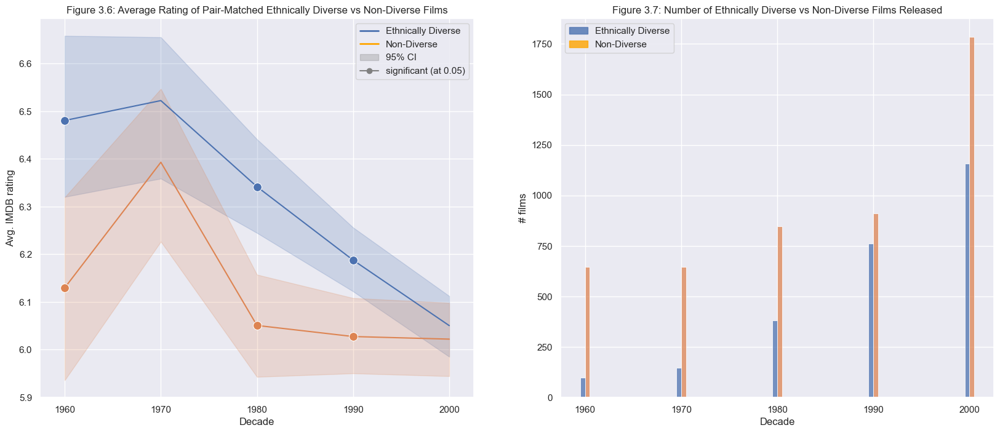

In [82]:
# 5. significance in difference in average ratings between treated and control after pair matching for each decade

fig, (ax2, ax3) = plt.subplots(1, 2, figsize=(20, 8), sharex=True)

# compute significance in difference in average ratings
df_matches = df_by_films.loc[matches]
p_values = df_matches.groupby('decade').apply(lambda x: stats.ttest_ind(x[x['ethnic_diverse']]['imdb_rating'], x[~x['ethnic_diverse']]['imdb_rating'], alternative='two-sided')[-1])
sig_decades = p_values[p_values < 0.05].index

print(df_matches.groupby('decade').size().values)
print(p_values)
print(sig_decades)

# plot decade ~ avg ratings of pair-matched ethnically diverse films (treated) vs non-ethnically diverse films (control) + significance markers 
sns.lineplot(df_matches, x='decade', y='imdb_rating', hue='ethnic_diverse', errorbar='ci', hue_order=[True, False], ax=ax2)
# add markers for statistically significant decades
sns.lineplot(df_matches[df_matches['decade'].isin(sig_decades)], x='decade', y='imdb_rating', hue='ethnic_diverse', hue_order=[True, False], errorbar=None, legend=False, ax=ax2, marker='o', linestyle='none', markersize=10)

# plot decade ~ # ethnically diverse films vs ethnically non-diverse films
sns.histplot(df_by_films, x='decade', hue='ethnic_diverse', hue_order=[True, False], discrete=True, multiple='dodge', ax=ax3)


ax2.set_title('Figure 3.6: Average Rating of Pair-Matched Ethnically Diverse vs Non-Diverse Films')
ax3.set_title('Figure 3.7: Number of Ethnically Diverse vs Non-Diverse Films Released')

ax2.set_xlabel('Decade')
ax3.set_xlabel('Decade')

ax2.set_ylabel('Avg. IMDB rating')
ax3.set_ylabel('# films')

marker_legend = Line2D([0], [0], marker='o', color='grey', markerfacecolor='grey', markersize=6, label='significant (at 0.05)')
legend_elements.append(marker_legend)
ax2.legend(handles=legend_elements)

legend_elements = [Patch(facecolor='b', edgecolor='b', label='Ethnically Diverse', alpha=0.8), Patch(facecolor='orange', edgecolor='orange', label='Non-Diverse', alpha=0.8)]
ax3.legend(handles=legend_elements)

<!-- correlation: more ethnically diverse films more well-received/higher rating

    - [ ] ethnic diversity associated/appreciated more/higher correlation in recent decades? 
    - [ ] raise question: ethnically diverse cast contributes to higher rating? 

causation & significance: greater ethnic diversity in cast influence/leads to higher rating
    - [ ] expect yes in recent decades where greater ethnic representation translates to higher rating/audience appreciation 


- ethnically diverse films average rating consistently higher, with overlapping ci in 1970s and 2000s
- after pair matching, still the case: 3 statiscally significant difference in means out of 5 decades => presence of influence/causality

- however, average rating of both groups face downward trend, but ethnically diverse films rating decreases more 
- more ethnically diverse films and more ethnically non-diverse films released over the decades alike 
- => potentially because in the earlier decades, few ethnically diverse films and they are generally highly rated, then more studios started producing more films featuring diverse casts and the average rating begin to converge to overall average rating/population mean -->

After establishing treatment group of ethnically diverse films and control group of ethnically non-diverse films, their average ratings are compared in Figure X.1. Notably, films with ethnically diverse cast are rated consistently higher, with only 95% confidence interval overlapping in 1970s and 2000s. After removing covariates such as release date, countries, languages and genres through propensity matching, the same still holds as ethnically diverse films consistently outperform non-diverse films in average rating in every decade. Hypothesis testing reveals that the differences in average ratings are statiscally significant in 3 of 5 decades highlighted in circles in Figure X.2. This confirms that films with ethnically diverse cast tend to be better-received by the audience and contribute to higher ratings. 

However, there exists an obvious downward trend for both groups, with the average rating of ethnically diverse films decreasing faster. This does not necessarily mean that audience appreciates ethnic diversity less over time. As evidenced by Figure X.3, there is a fast-paced growth in the number of ethnically diverse films released over the decades. The decline in rating of ethnically diverse films coincide with this growth. As this number approaches and even surpasses in the last 2 decades the number for ethnically non-diverse films in the previous decades, the average rating of ethnically diverse films also closes in on that of non-diverse ones. This could potentially be because in the earlier decades, few ethnically diverse films are made and they are generally rated quite well. This possibly motivated movie studios to produce more films featuring diverse casts and with increasing volume, the average rating begin to converge to overall average rating representative of the true population mean. This would mean despite recent laudable calls in the public for greater ethnic diversity on the film set, history has shown that ethnic diversity alone does not translate to higher rating.